# Import necessary libraries

In [134]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from scipy import stats
import os
import glob
import math
sns.set_style("white")
pd.options.mode.chained_assignment = None  # default='warn'

# Importing dataframes

## Defining cleaning functions

In [135]:
def item_header_clean(df):
    column_map = {
    "index" : "League",
    "League": "Date",
    "Date": "Id",
    "Id" : "Type"
    }
    df_indexreset = df.reset_index()
    df_renamed = df_indexreset.rename(columns = column_map)
    return df_renamed

def item_info_fix(df):
    cols_to_drop = ["Links", "Variant"]
    df_cols_dropped = df.drop(cols_to_drop, axis = 1)
    df_cols_dropped.BaseType = df_cols_dropped.BaseType.fillna(df_cols_dropped.Type)
    df_fixed = df_cols_dropped
    return df_fixed

def item_top_40_filter(df):
    median_series = df.groupby("Name")["Value"].agg("median")
    sorted_series = median_series.sort_values(ascending = False)
    top_40_list = list(sorted_series[:40].index)
    df_top_40 = df.loc[df["Name"].isin(top_40_list)]
    return df_top_40

def add_relative_date(df):
    df_copy = df
    df_copy["Date"] = df_copy["Date"].astype('datetime64[D]')
    startdate = df_copy["Date"].min()
    df_copy["RelativeDate"] = (df_copy["Date"] - startdate)
    df_edited = df_copy.drop("Date", axis = 1)
    df_edited["RelativeDate"] = pd.to_timedelta(df_edited["RelativeDate"], unit = "D")
    df_edited["RelativeDateInt"] = df_edited["RelativeDate"] / np.timedelta64(1, 'D')
    return df_edited

def league_lifespan(row):
    early_league = dt.timedelta(days = 14)
    mid_league = dt.timedelta(days = 60)
    if row["RelativeDate"] <= early_league:
        return "Early"
    elif row["RelativeDate"] <= mid_league:
        return "Mid"
    return "End"

def item_file_clean(df):
    df1 = item_header_clean(df)
    df2 = item_info_fix(df1)
    df3 = item_top_40_filter(df2)
    df4 = add_relative_date(df3)
    df4["League Lifespan"] = df4.apply(league_lifespan, axis = 1)
    return df4

def currency_info_fix(df):
    currency_to_drop = ["Portal Scroll", "Scroll of Wisdom", "Armourer's Scrap", "Perandus Coin", "Orb of Transmutation", "Blacksmith's Whetstone", "Orb of Augmentation", "Orb of Alteration", "Splinter of Tul", "Chromatic Orb", "Splinter of Esh", "Splinter of Xoph", "Orb of Chance", "Glassblower's Bauble", "Splinter of Uul-Netol", "Silver Coin"]
    df_currency_fixed = df.loc[~(df["Get"].isin(currency_to_drop) | df["Pay"].isin(currency_to_drop))]
    return df_currency_fixed

def currency_file_clean(df):
    df1 = currency_info_fix(df)
    df2 = add_relative_date(df1)
    df2["League Lifespan"] = df2.apply(league_lifespan, axis = 1)
    return df2

## File Import and Concatenation

In [136]:
# Import/Concatenate item files
item_df_list = []
for filename in glob.glob("*_items.csv"):
    df = pd.read_csv(filename, delimiter = ";", low_memory = False)
    df_edited = item_file_clean(df)
    item_df_list.append(df_edited)
item_df = pd.concat(item_df_list, axis = 0)
del item_df_list
item_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21009 entries, 11926 to 226813
Data columns (total 10 columns):
League             21009 non-null object
Id                 21009 non-null int64
Type               21009 non-null object
Name               21009 non-null object
BaseType           21009 non-null object
Value              21009 non-null float64
Confidence         21009 non-null object
RelativeDate       21009 non-null timedelta64[ns]
RelativeDateInt    21009 non-null float64
League Lifespan    21009 non-null object
dtypes: float64(2), int64(1), object(6), timedelta64[ns](1)
memory usage: 1.8+ MB


In [137]:
#Import/Concatenate currency files
currency_df_list = []
for filename in glob.glob("*_currency.csv"):
    df = pd.read_csv(filename, delimiter = ";", low_memory = False)
    df_edited = currency_file_clean(df)
    currency_df_list.append(df_edited)
currency_df = pd.concat(currency_df_list, axis = 0)
del currency_df_list
currency_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38885 entries, 356 to 9466
Data columns (total 8 columns):
League             38885 non-null object
Get                38885 non-null object
Pay                38885 non-null object
Value              38885 non-null float64
Confidence         38885 non-null object
RelativeDate       38885 non-null timedelta64[ns]
RelativeDateInt    38885 non-null float64
League Lifespan    38885 non-null object
dtypes: float64(2), object(5), timedelta64[ns](1)
memory usage: 2.7+ MB


## Paring down item table to only include items common across all leagues

In [138]:
def common_items(df):
    unique_items = []
    for league in df.League.unique():
        league_df = df[df.League == league]
        unique_items.append(league_df.Name.unique().tolist())
    return list(set(unique_items[0]).intersection(*unique_items))

In [139]:
list_of_items = common_items(item_df)

#Remove specific items that don't make sense to track due to variations or lack of accessibility
items_to_remove = ["Eyes of the Greatwolf", "Demigod's Dominance"]
for item in items_to_remove:
    list_of_items.remove(item)

item_df_pared = item_df.loc[item_df["Name"].isin(list_of_items)]

#Set up specific item lists that group items with possible dependencies on each other
hh_items = ["The Fiend", "The Doctor", "Headhunter"]
chayula_items = ["United in Dream", "The Blue Nightmare", "The Green Nightmare", "The Red Nightmare"]
misc_items = ["Starforge", "The Retch", "Atziri's Disfavour", "Emperor's Mastery", "Skyforth", "Atziri's Acuity"]
misc_pd = ["House of Mirrors", "Trash to Treasure", "Fated Connections"]
list_of_groups = [hh_items, chayula_items, misc_items, misc_pd]
item_group_names = ["Headhunter Related Items", "Chayula Related Items", "Miscellaneous Items", "Miscellaneous Prophecies/Divination Cards"]

## Pare down both item and currency table to only include the last 90 days and not the first day

In [140]:
item_df_pared = item_df_pared[(item_df_pared["RelativeDateInt"] <= 90) & (item_df_pared["RelativeDateInt"] > 1)]
currency_df_pared = currency_df[(currency_df["RelativeDateInt"] <= 90) & (currency_df["RelativeDateInt"] > 1)]

# Preliminary Data Visualization

## Item Trends
### By League

First, Let's take a look at the items and the changes in their values over the course of a league.

In [141]:
league_indexed_items = item_df_pared.set_index("League")
league_indexed_items = league_indexed_items.sort_index()
league_name_list = list(league_indexed_items.index.unique())
league_name_list

['Abyss', 'Breach', 'Harbinger', 'Legacy']

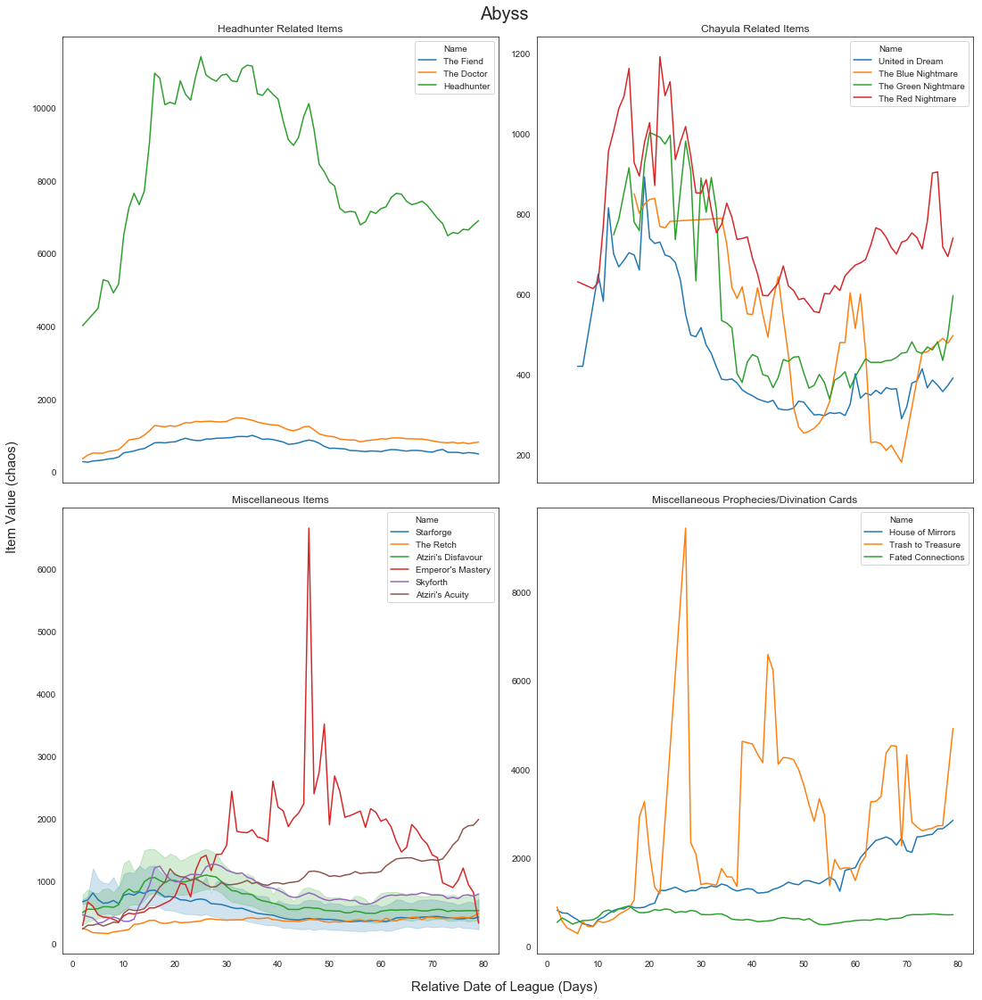

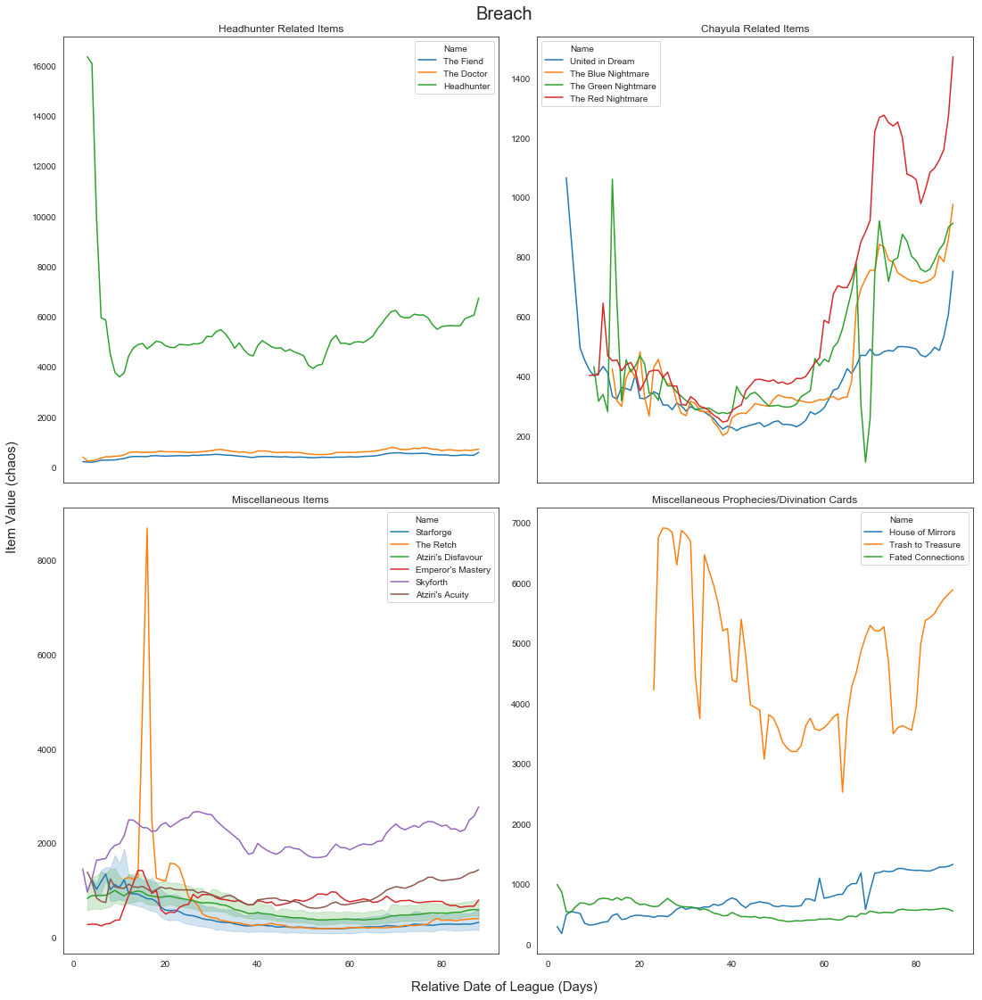

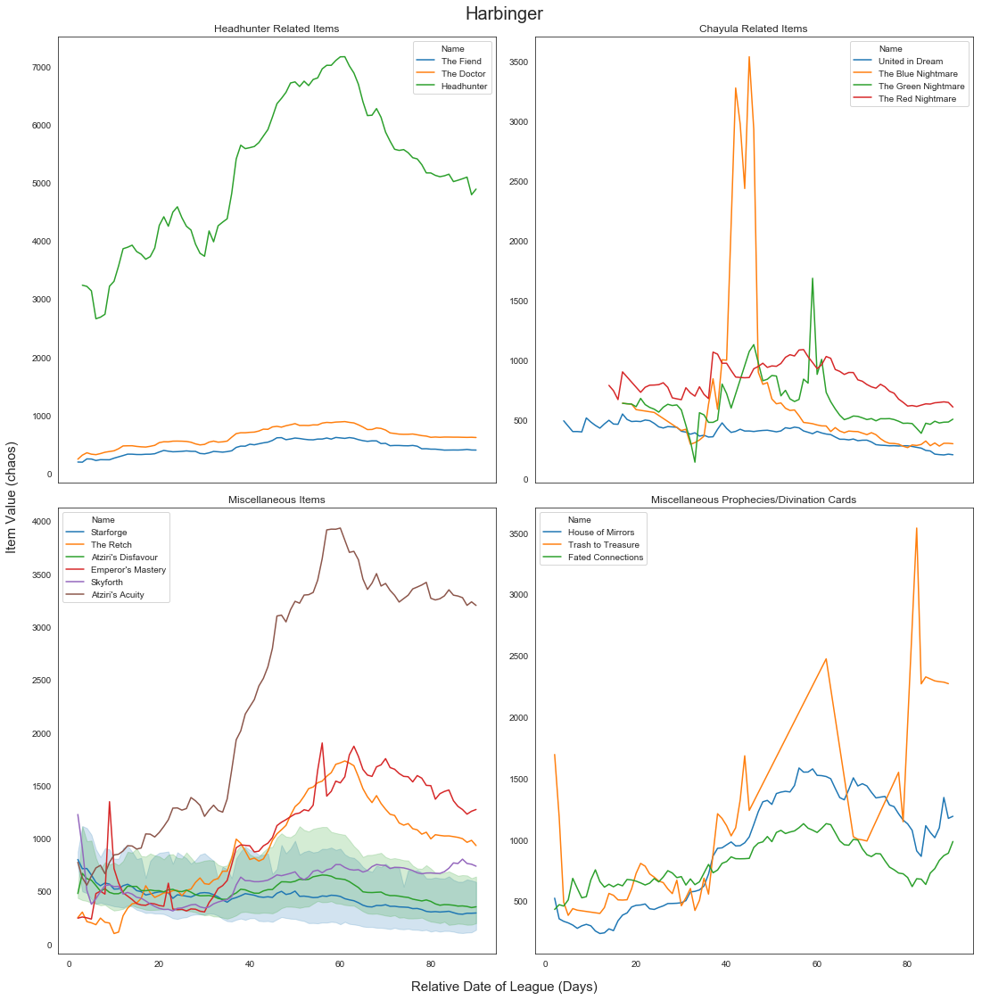

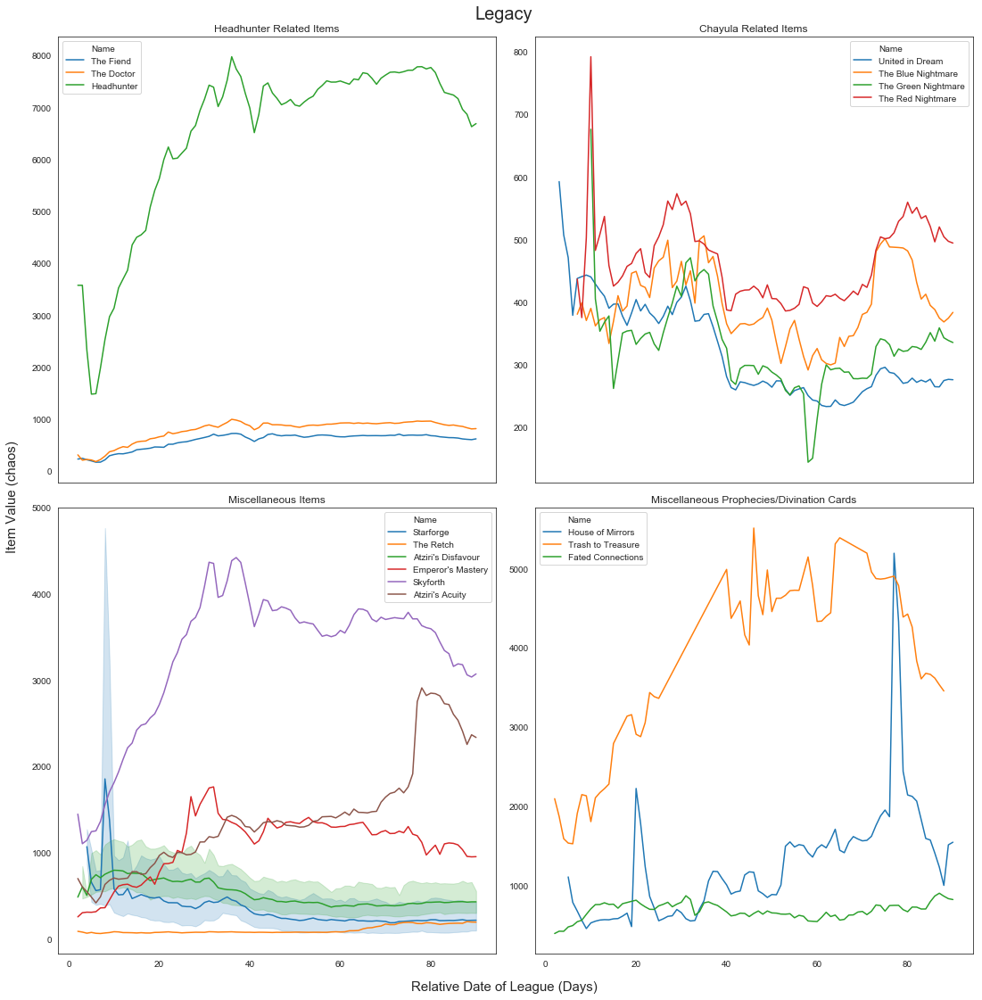

In [142]:
for league in league_name_list:
    league_items = league_indexed_items.loc[league]
    fig, axes = plt.subplots(2, 2, figsize = (15, 15), sharex = True)
    fig.text(0.5, -.01, 'Relative Date of League (Days)', ha='center', va='center', fontsize = 15)
    fig.text(-.01, 0.5, 'Item Value (chaos)', ha='center', va='center', fontsize = 15, rotation = "vertical")
    fig.text(0.5, 1, league, ha='center', va='center', fontsize = 20)
    for ax, i in zip(axes.flat, range(4)):
        df_items = league_items.loc[league_items["Name"].isin(list_of_groups[i])]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Name", data = df_items, ax = ax, hue_order = list_of_groups[i])
        ax.set(xlabel = "", ylabel = "", title = item_group_names[i])
    fig.tight_layout()

### By Item

Now, we'll do a similar graphing process as above, but this time split by specific items in an item group to compare unique items value changes over the course of all the leagues. 

In [143]:
item_indexed_items = item_df_pared.set_index("Name")
item_indexed_items = item_indexed_items.sort_index()
item_name_list = list(item_indexed_items.index.unique())
print(item_name_list)
print(len(item_name_list))

["Atziri's Acuity", "Atziri's Disfavour", "Emperor's Mastery", 'Fated Connections', 'Headhunter', 'House of Mirrors', 'Skyforth', 'Starforge', 'The Blue Nightmare', 'The Doctor', 'The Fiend', 'The Green Nightmare', 'The Red Nightmare', 'The Retch', 'Trash to Treasure', 'United in Dream']
16


In [144]:
print(list_of_groups)
print(item_group_names)

[['The Fiend', 'The Doctor', 'Headhunter'], ['United in Dream', 'The Blue Nightmare', 'The Green Nightmare', 'The Red Nightmare'], ['Starforge', 'The Retch', "Atziri's Disfavour", "Emperor's Mastery", 'Skyforth', "Atziri's Acuity"], ['House of Mirrors', 'Trash to Treasure', 'Fated Connections']]
['Headhunter Related Items', 'Chayula Related Items', 'Miscellaneous Items', 'Miscellaneous Prophecies/Divination Cards']


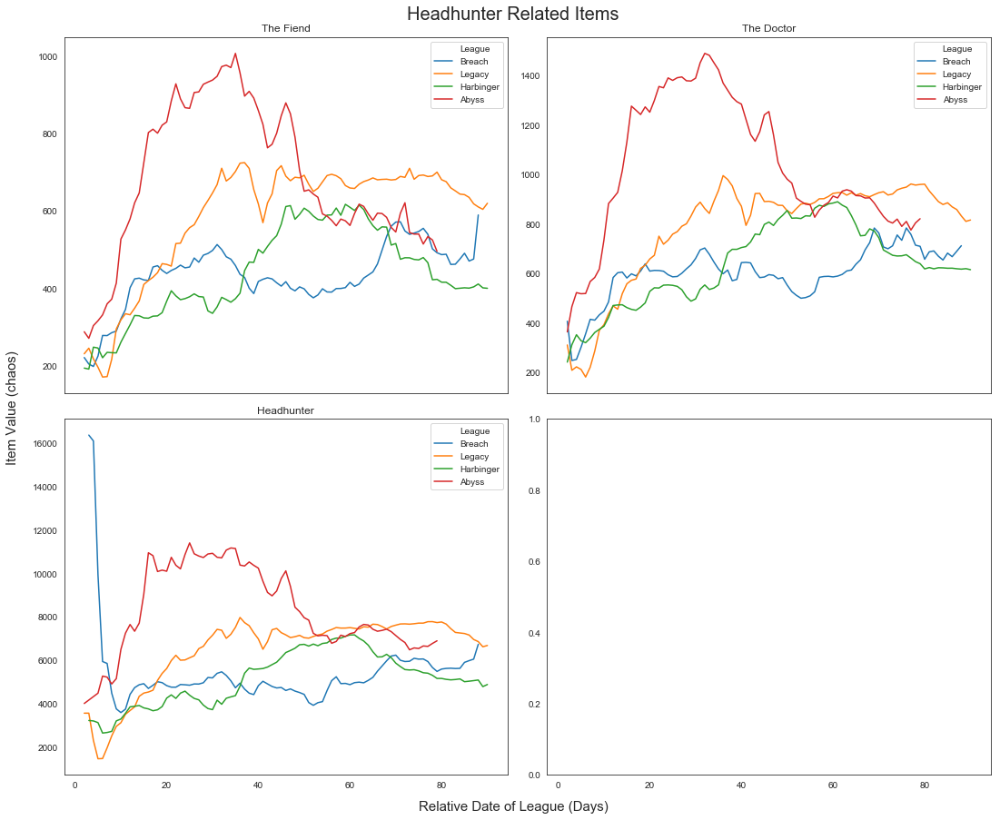

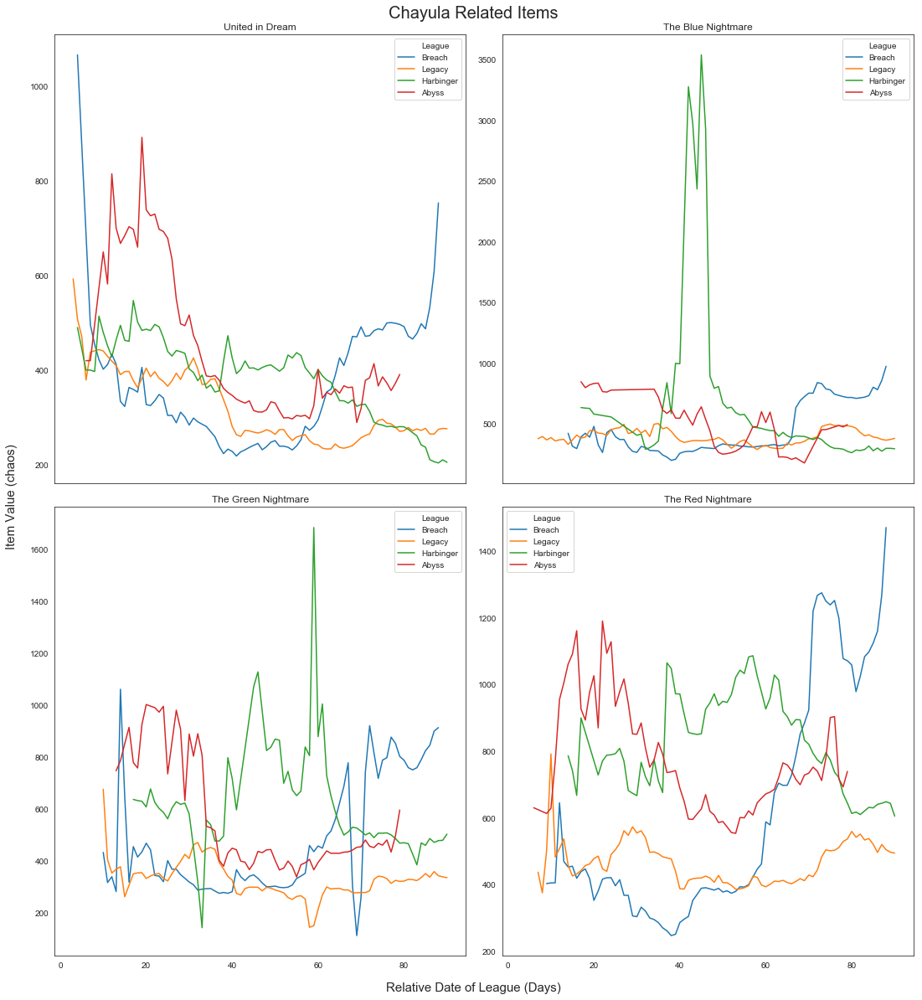

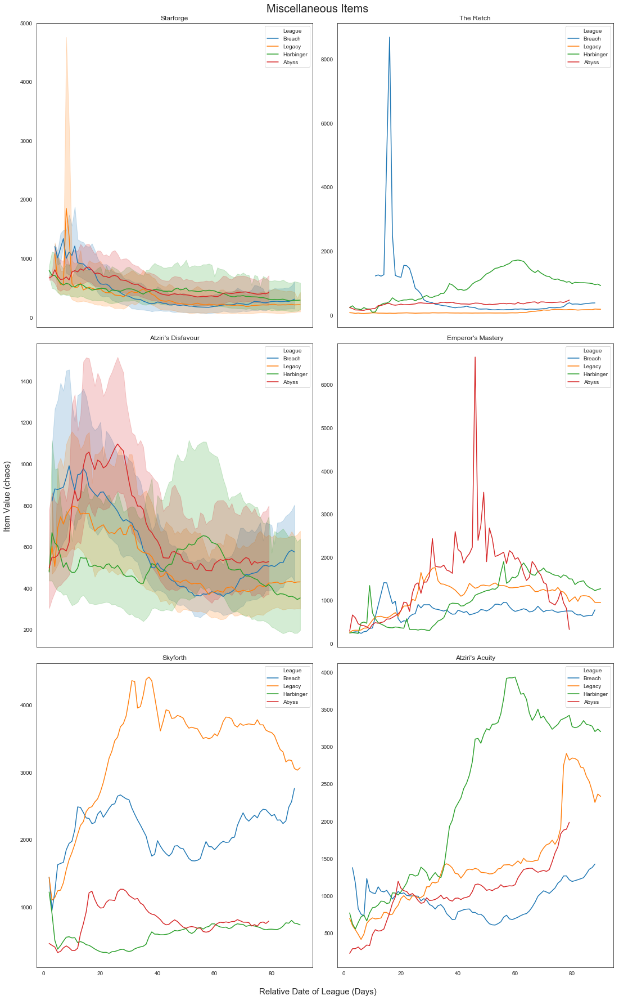

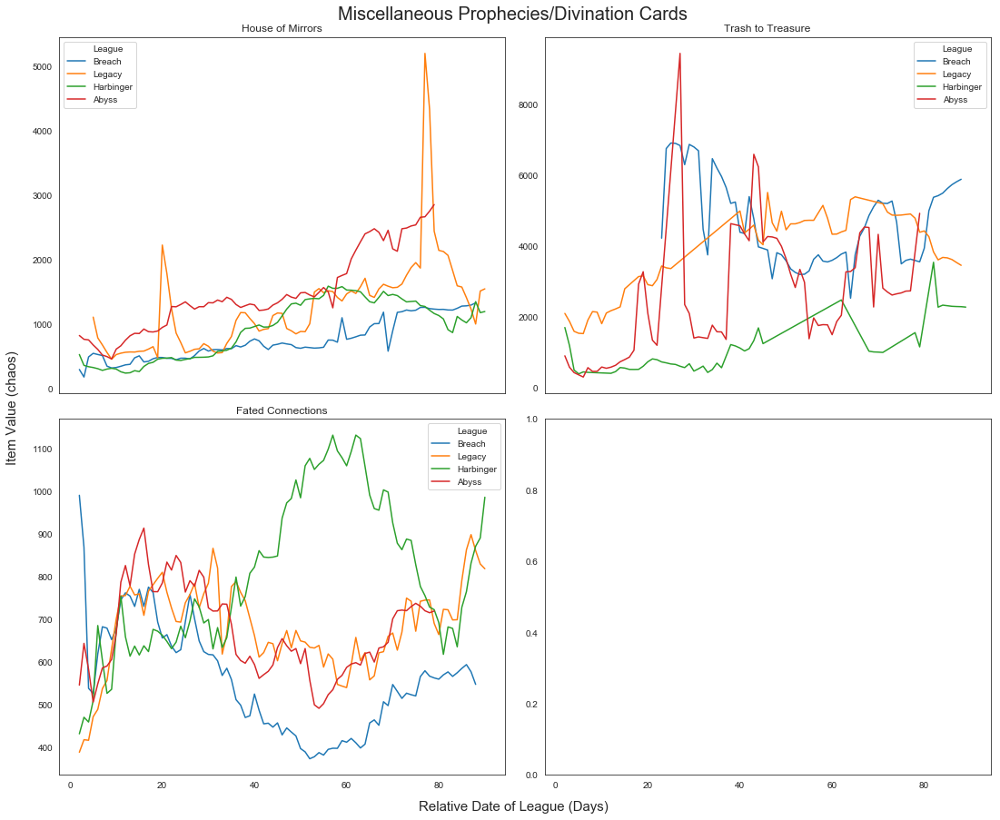

In [145]:
for group, i in zip(list_of_groups, range(len(list_of_groups))):
    fig, axes = plt.subplots(math.ceil(len(group)/2), 2, figsize = (15, len(group)*4), sharex = True)
    fig.text(0.5, -.01, 'Relative Date of League (Days)', ha='center', va='center', fontsize = 15)
    fig.text(-.01, 0.5, 'Item Value (chaos)', ha='center', va='center', fontsize = 15, rotation = "vertical")
    fig.text(0.5, 1, item_group_names[i], ha='center', va='center', fontsize = 20)
    for ax, item in zip(axes.flat, group):
        item_values = item_indexed_items.loc[item]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", data = item_values, hue_order = ["Breach", "Legacy", "Harbinger", "Abyss"], ax = ax)
        ax.set(xlabel = "", ylabel = "", title = item)
    fig.tight_layout()

#### Boxplot vs lineplot of items

Now let's take a look at the value of *each* item compared against each other across the different leagues using a boxplot superimposed over a lineplot.

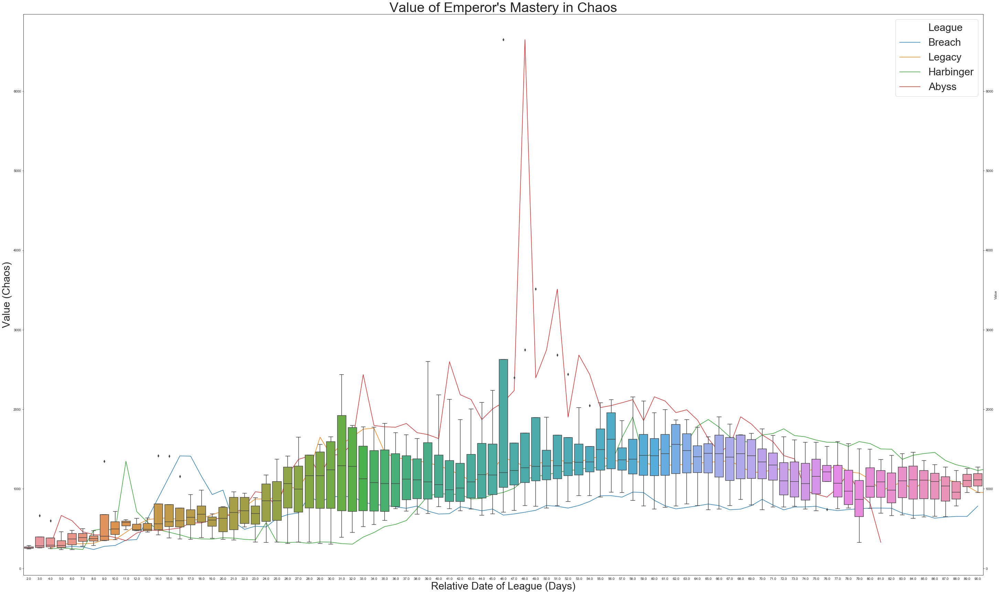

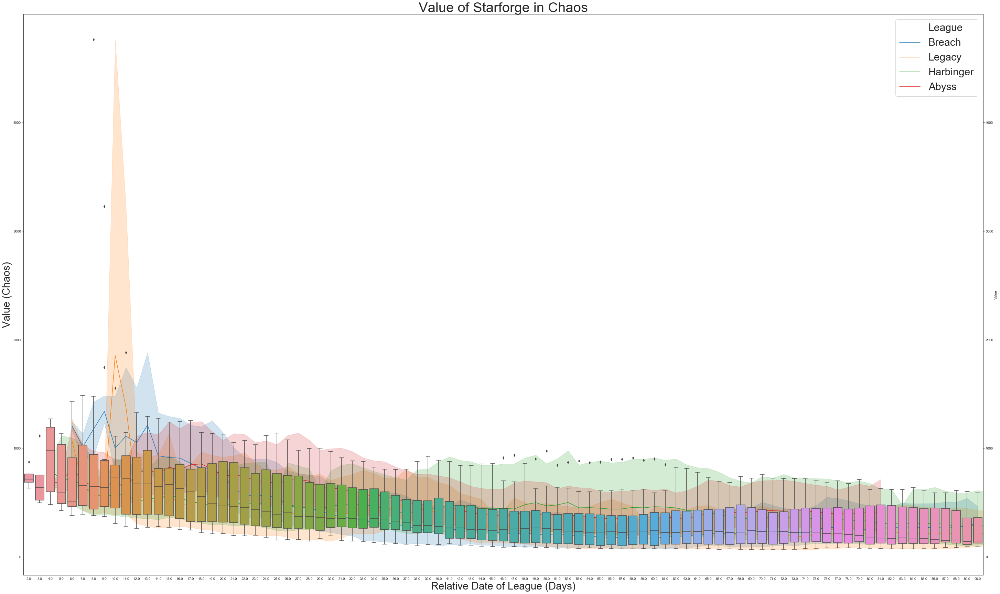

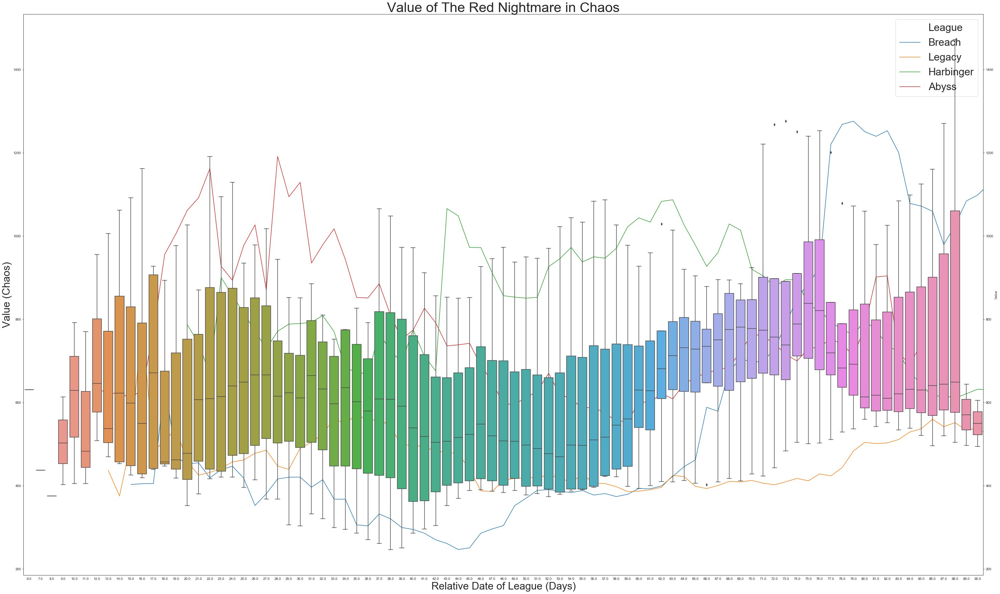

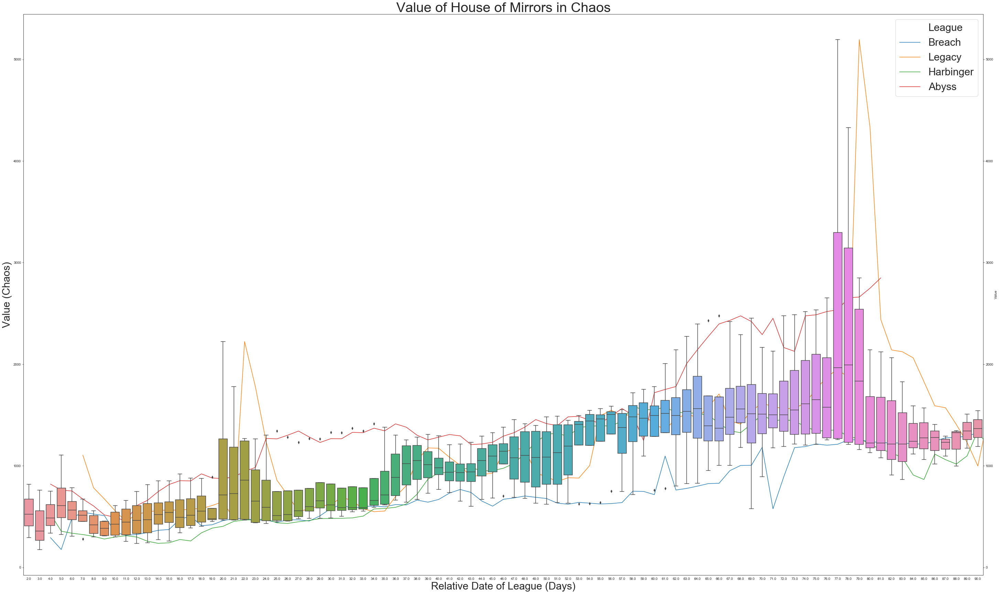

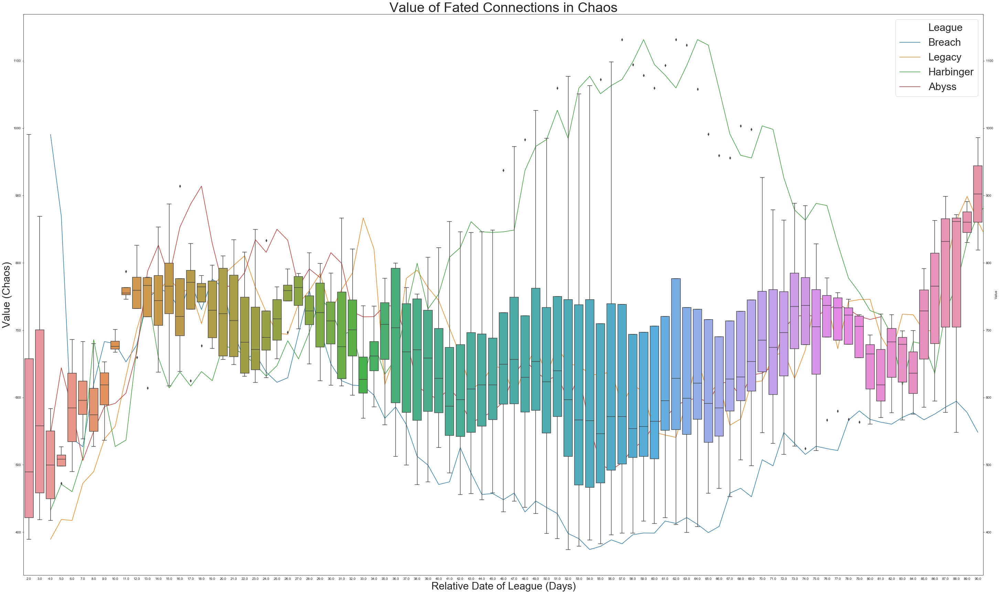

...

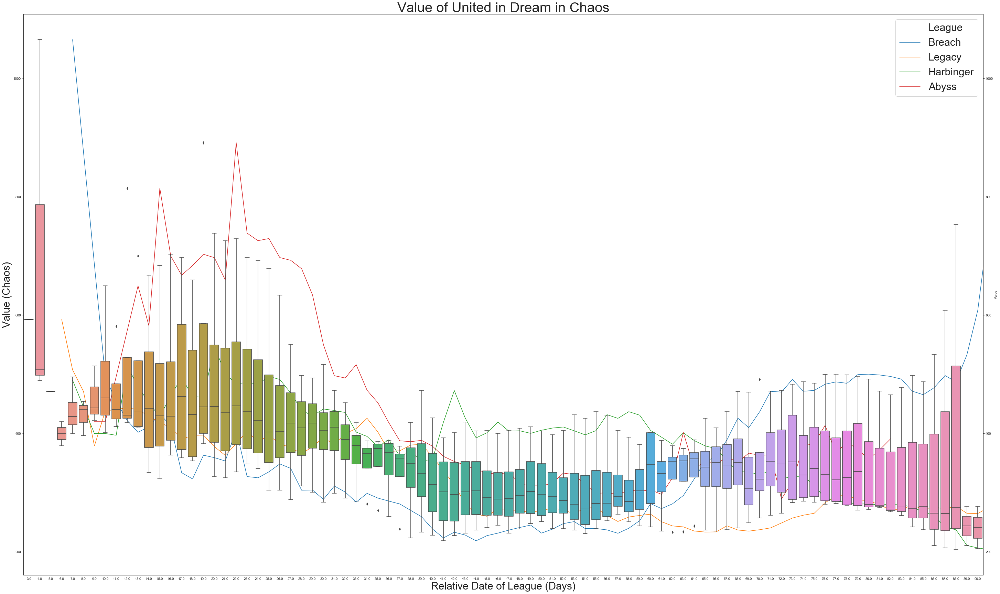

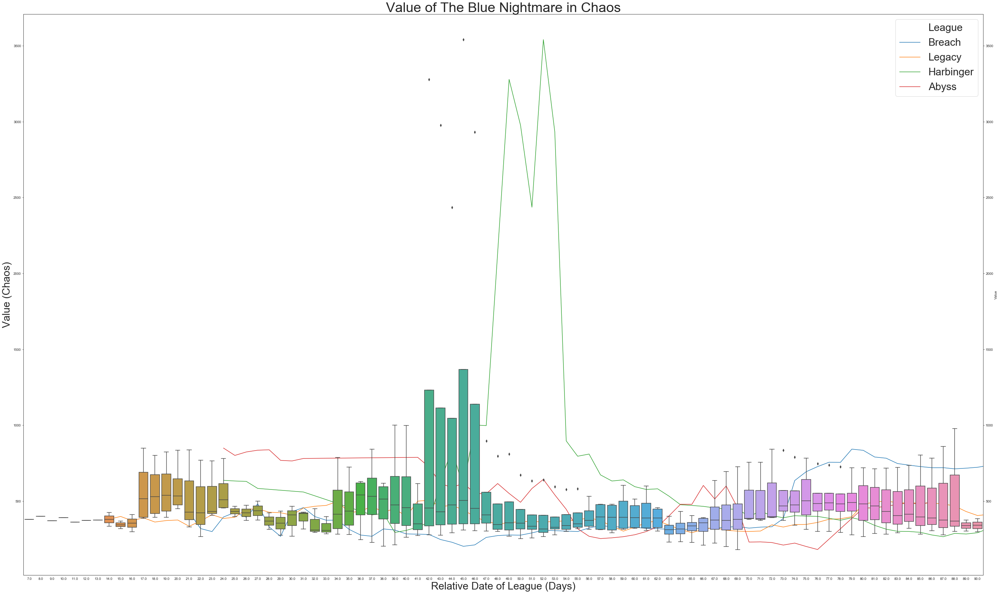

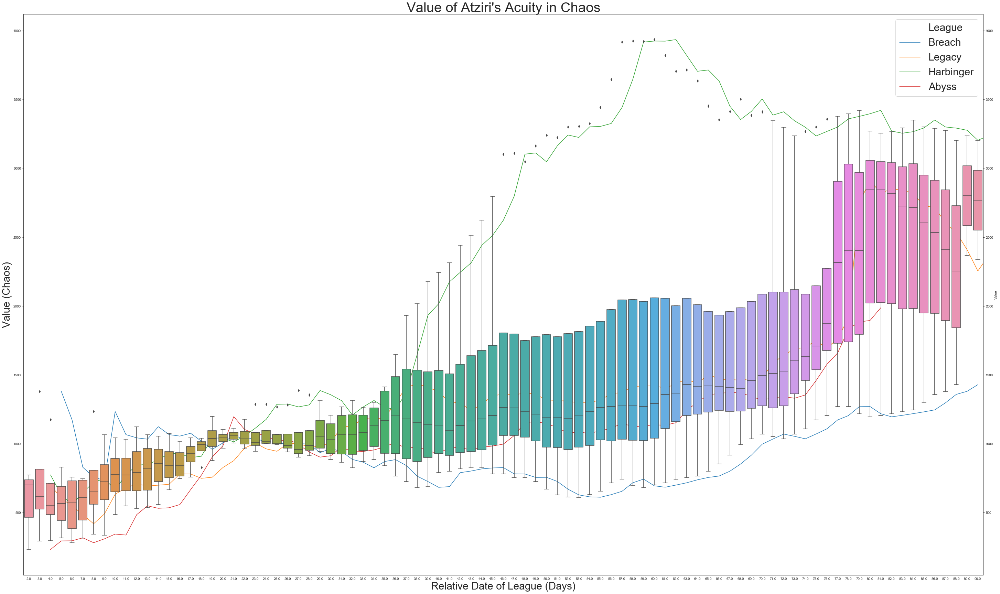

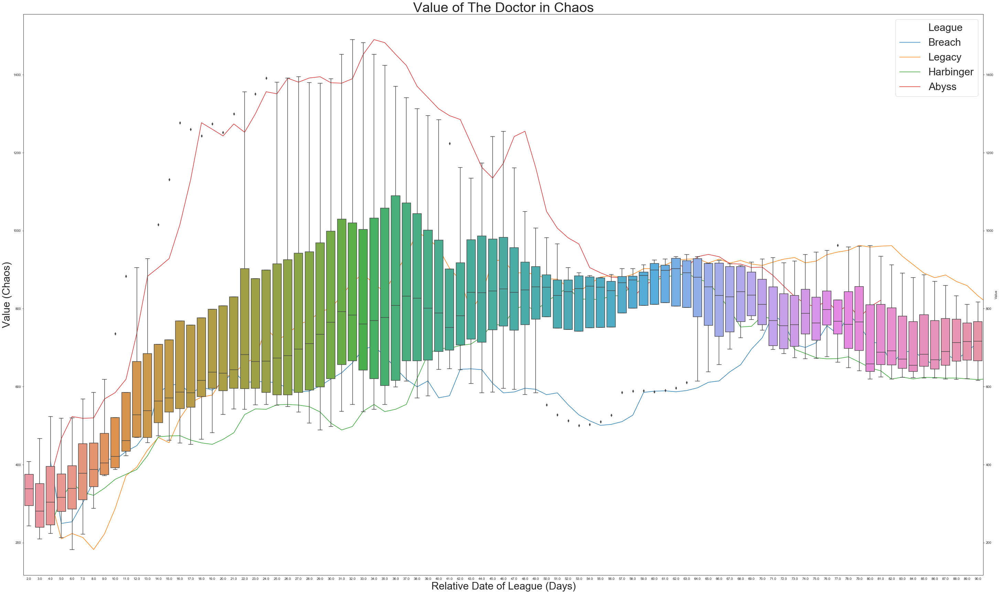

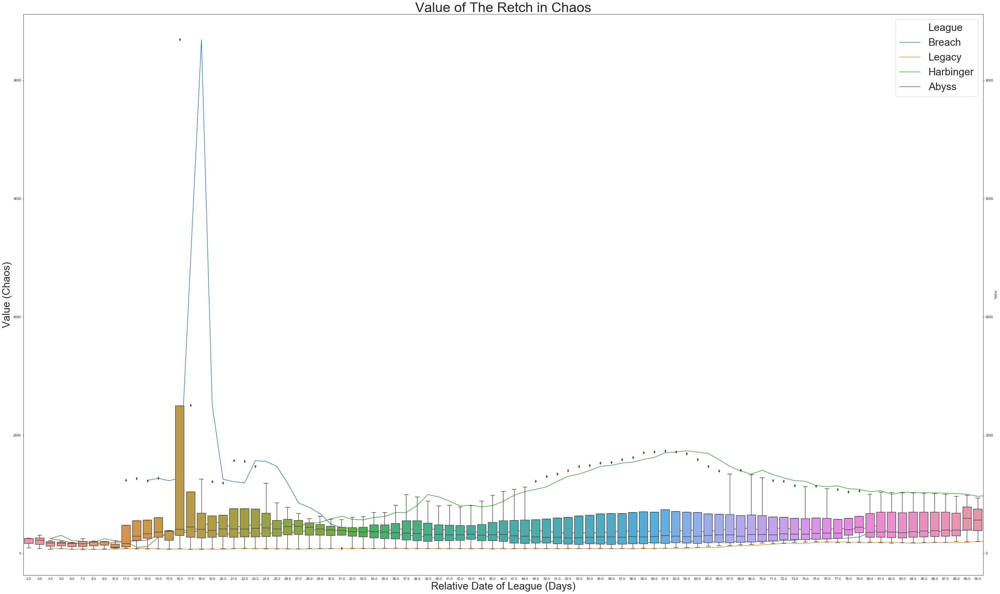

In [146]:
for item in list_of_items:
    df_items = item_df_pared.loc[item_df_pared["Name"] == item]
    plt.figure(figsize = (50, 30))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = df_items, hue = "League", hue_order = ["Breach", "Legacy", "Harbinger", "Abyss"])
    #ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Value (Chaos)", title = "Value of " + item + " in Chaos", fontsize = 20)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 30)
    ax.set_ylabel("Value (Chaos)", fontsize = 30)
    ax.set_title("Value of " + item + " in Chaos", fontsize = 40)
    ax.legend(fontsize = 30)
    ax2 = ax.twinx()
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = df_items)
    fig.tight_layout()

## Currency Trends
Now let's take a look at the currency data we've compiled.
### More Data Cleaning

In [147]:
currency_df_pared.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30475 entries, 358 to 9466
Data columns (total 8 columns):
League             30475 non-null object
Get                30475 non-null object
Pay                30475 non-null object
Value              30475 non-null float64
Confidence         30475 non-null object
RelativeDate       30475 non-null timedelta64[ns]
RelativeDateInt    30475 non-null float64
League Lifespan    30475 non-null object
dtypes: float64(2), object(5), timedelta64[ns](1)
memory usage: 2.1+ MB


In [148]:
def common_currency(df):
    unique_currencies = []
    for league in df.League.unique():
        league_df = df[df.League == league]
        unique_currencies.append(league_df.Get.unique().tolist())
        unique_currencies.append(league_df.Pay.unique().tolist())
    return list(set(unique_currencies[0]).intersection(*unique_currencies))

In [149]:
list_of_currencies = common_currency(currency_df_pared)
print(np.sort(list_of_currencies))
print(len(list_of_currencies))

["Apprentice Cartographer's Sextant" 'Blessed Orb' 'Blessing of Chayula'
 'Blessing of Esh' 'Blessing of Tul' 'Blessing of Uul-Netol'
 'Blessing of Xoph' "Cartographer's Chisel" 'Chaos Orb'
 "Chayula's Breachstone" 'Divine Orb' "Eber's Key" "Esh's Breachstone"
 'Exalted Orb' 'Fragment of the Chimera' 'Fragment of the Hydra'
 'Fragment of the Minotaur' 'Fragment of the Phoenix' "Gemcutter's Prism"
 "Inya's Key" "Jeweller's Orb" "Journeyman Cartographer's Sextant"
 "Master Cartographer's Sextant" 'Mortal Grief' 'Mortal Hope'
 'Mortal Ignorance' 'Mortal Rage' 'Offering to the Goddess'
 'Orb of Alchemy' 'Orb of Fusing' 'Orb of Regret' 'Orb of Scouring'
 'Regal Orb' 'Sacrifice at Dawn' 'Sacrifice at Dusk'
 'Sacrifice at Midnight' 'Sacrifice at Noon' 'Splinter of Chayula'
 "Tul's Breachstone" "Uul-Netol's Breachstone" 'Vaal Orb' "Volkuur's Key"
 "Xoph's Breachstone" "Yriel's Key"]
44


In [150]:
currency_to_pay = ["Apprentice Cartographer's Sextant", "Blessed Orb", "Cartographer's Chisel", "Chaos Orb", "Exalted Orb", "Journeyman Cartographer's Sextant", "Master Cartographer's Sextant", "Orb of Alchemy", "Orb of Fusing", "Regal Orb"]
currency_df_pared = currency_df_pared.loc[currency_df_pared["Get"].isin(list_of_currencies) & currency_df_pared["Pay"].isin(currency_to_pay)]
currency_df_pared.info()
currency_df_pared.Pay.unique()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17838 entries, 358 to 8760
Data columns (total 8 columns):
League             17838 non-null object
Get                17838 non-null object
Pay                17838 non-null object
Value              17838 non-null float64
Confidence         17838 non-null object
RelativeDate       17838 non-null timedelta64[ns]
RelativeDateInt    17838 non-null float64
League Lifespan    17838 non-null object
dtypes: float64(2), object(5), timedelta64[ns](1)
memory usage: 1.2+ MB


array(['Chaos Orb', 'Orb of Fusing', 'Orb of Alchemy', 'Exalted Orb',
       'Regal Orb', "Cartographer's Chisel", 'Blessed Orb',
       "Journeyman Cartographer's Sextant",
       "Master Cartographer's Sextant",
       "Apprentice Cartographer's Sextant"], dtype=object)

In [151]:
# Setting up different filter groups for the currencies based off of relatedness

exalts_divines = ["Exalted Orb", "Divine Orb"]
major_orbs = ["Orb of Regret", "Gemcutter's Prism", "Regal Orb", "Vaal Orb"]
minor_orbs = ["Blessed Orb", "Cartographer's Chisel", "Orb of Scouring", "Jeweller's Orb", "Orb of Alchemy", "Orb of Fusing"]
sextants = ["Apprentice Cartographer's Sextant", "Journeyman Cartographer's Sextant", "Master Cartographer's Sextant"]
atziri = ['Sacrifice at Dawn', 'Sacrifice at Dusk', 'Sacrifice at Midnight', 'Sacrifice at Noon']
uber_atziri = ['Mortal Grief', 'Mortal Hope', 'Mortal Ignorance', 'Mortal Rage']
shaper_frags = ['Fragment of the Chimera', 'Fragment of the Hydra', 'Fragment of the Minotaur', 'Fragment of the Phoenix']
breach_blessings = ['Blessing of Chayula', 'Blessing of Esh', 'Blessing of Tul', 'Blessing of Uul-Netol', 'Blessing of Xoph']
breach_items = ["Chayula's Breachstone", "Esh's Breachstone", "Tul's Breachstone", "Uul-Netol's Breachstone", "Splinter of Chayula"]
council_keys = ["Eber's Key", "Inya's Key", "Volkuur's Key", "Yriel's Key"]
offering = ["Offering to the Goddess"]

In [152]:
non_orb_groups = [sextants, atziri, uber_atziri, shaper_frags, breach_blessings, breach_items, council_keys, offering]
non_orb_groups_names = ["Sextants", "Atziri Fragments", "Uber Atziri Fragments", "Shaper Fragments", "Breach Blessings", "Breachstone Items", "Council Keys", "Offering to the Goddess"]

### By League
As above, we'll start by looking at the values over the course of the league by each league. We will only specify the values where you're using a chaos orb as a payment. We do this because in game, the chaos orb is the most commonly used currency to conduct trades and thus we'll be moving forward with the assumption of it being the equivalent of the "dollar" in game.

In [153]:
league_indexed_currency = currency_df_pared.set_index("League")
league_indexed_currency = league_indexed_currency.sort_index()
league_indexed_currency.head()

,Get,Pay,Value,Confidence,RelativeDate,RelativeDateInt,League Lifespan
League,,,,,,,
Abyss,Uul-Netol's Breachstone,Chaos Orb,11.08956,High,80 days,80.0,End
Abyss,Blessed Orb,Chaos Orb,0.33142,High,32 days,32.0,Mid
Abyss,Blessed Orb,Chaos Orb,0.33313,High,31 days,31.0,Mid
Abyss,Blessed Orb,Chaos Orb,0.33333,High,30 days,30.0,Mid
Abyss,Blessed Orb,Chaos Orb,0.33333,High,29 days,29.0,Mid


#### Comparing non-orb values to chaos values

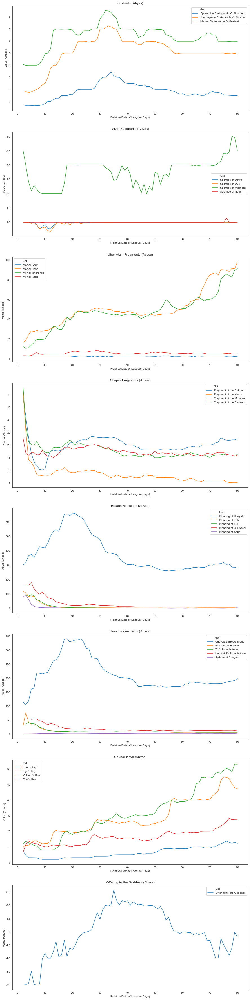

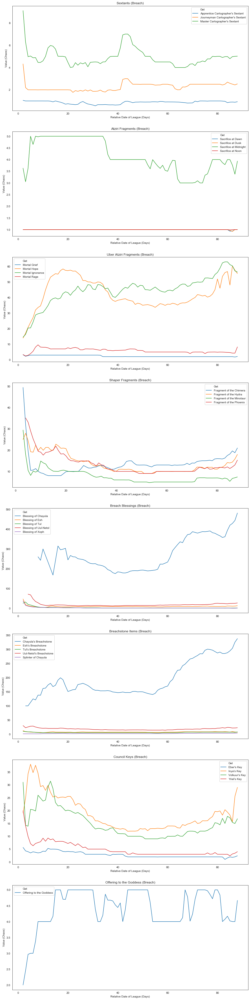

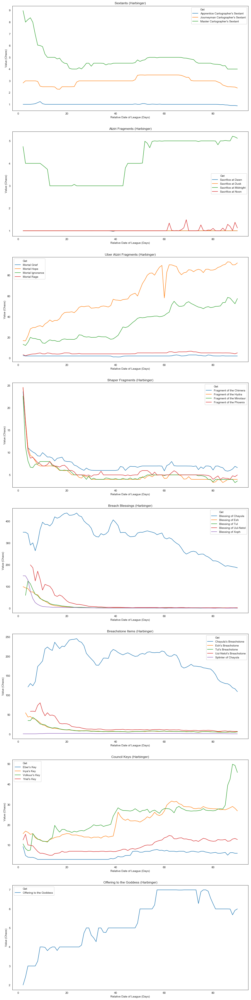

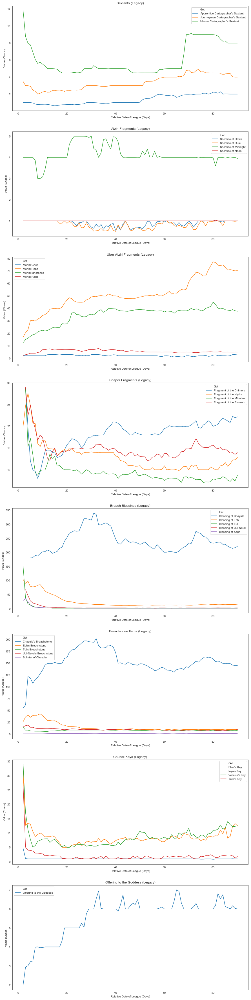

In [154]:
for league in league_name_list:
    league_currency = league_indexed_currency.loc[league]
    league_chaos = league_currency[league_currency.Pay == "Chaos Orb"]
    fig, axes = plt.subplots(len(non_orb_groups), 1, figsize = (15, len(non_orb_groups)*8))
    for ax, group, group_name in zip(axes.flat, non_orb_groups, non_orb_groups_names):
        df_currency = league_chaos.loc[league_chaos["Get"].isin(group)]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Get", data = df_currency, ax = ax, hue_order = group)
        ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Value (Chaos)", title = group_name + " (" + league + ")")

#### Comparing orb values to chaos values

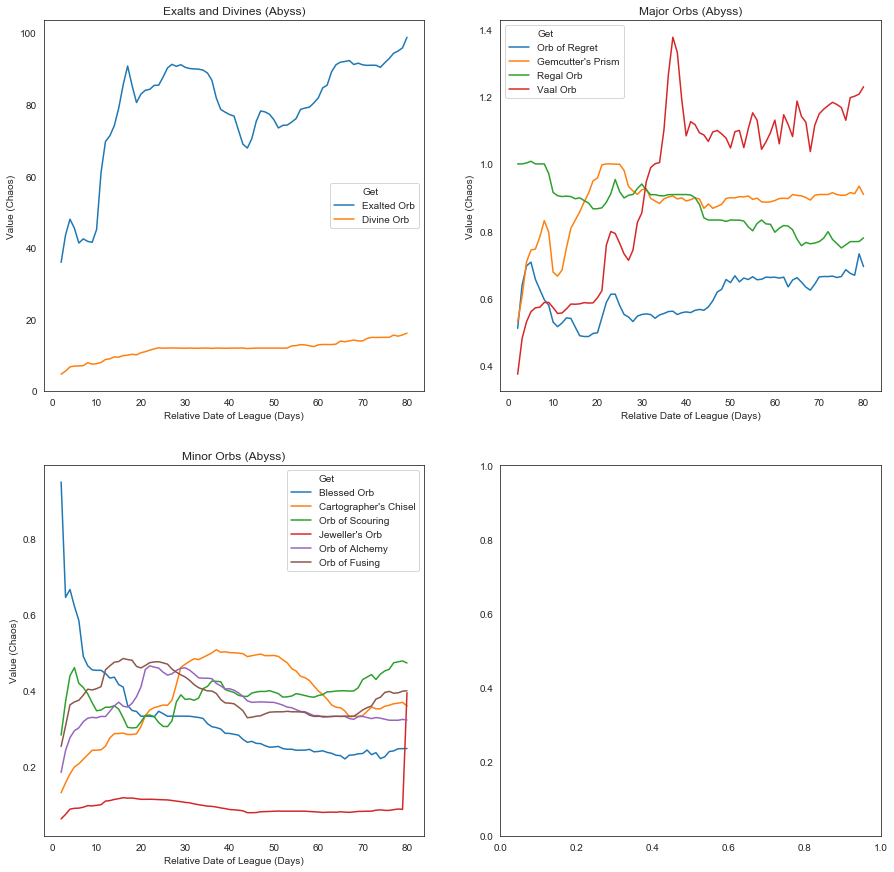

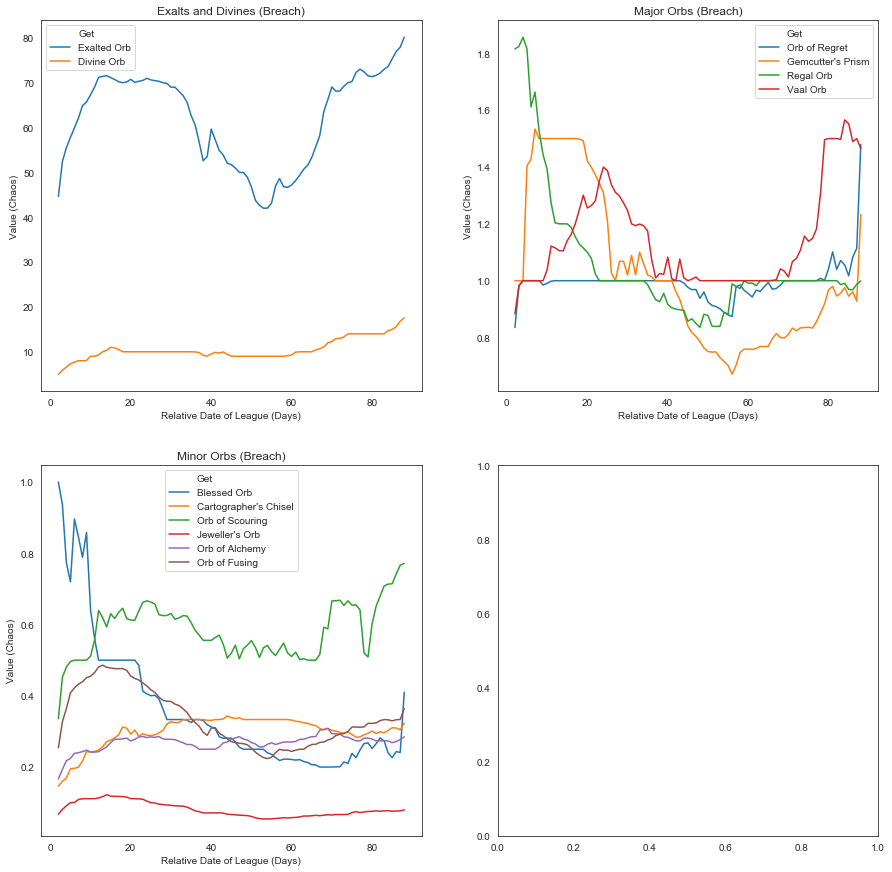

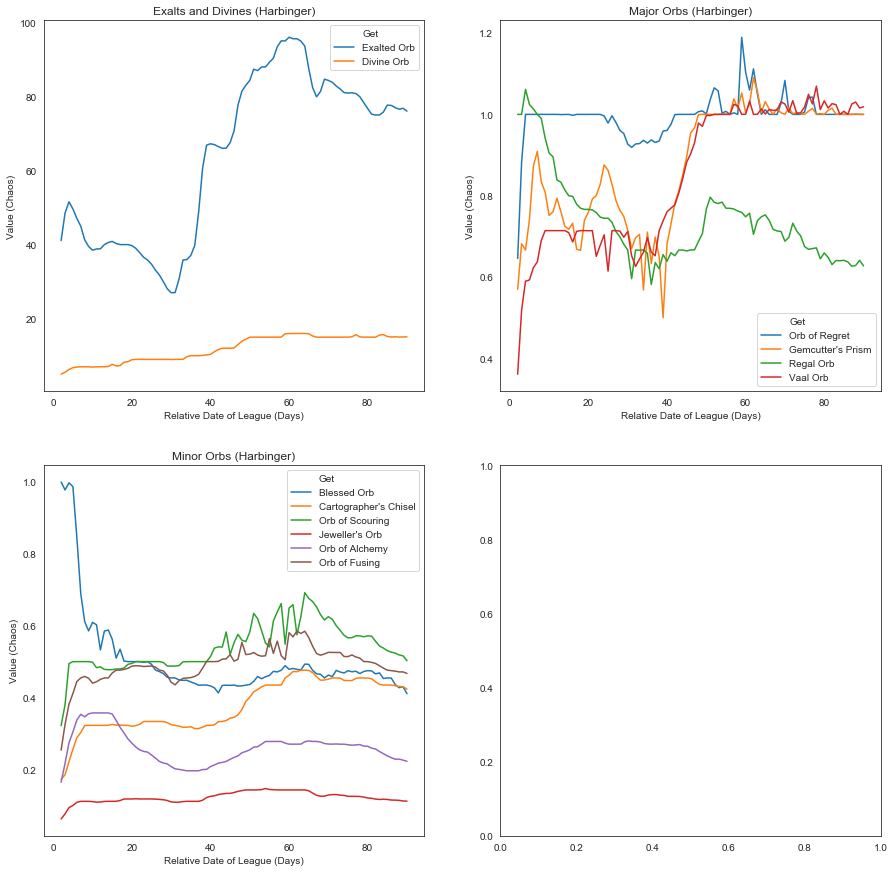

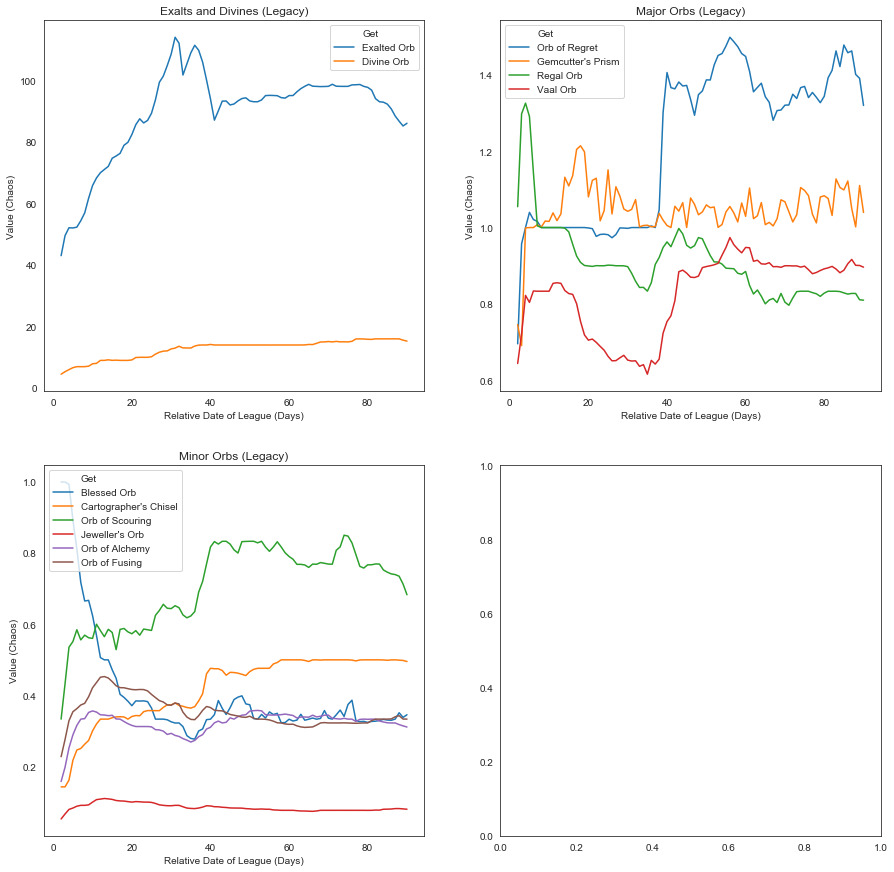

In [155]:
for league in league_name_list:
    league_currency = league_indexed_currency.loc[league]
    league_chaos = league_currency[league_currency.Pay == "Chaos Orb"]
    fig, axes = plt.subplots(2, 2, figsize = (15, 15))
    for ax, group, group_name in zip(axes.flat, [exalts_divines, major_orbs, minor_orbs], ["Exalts and Divines", "Major Orbs", "Minor Orbs"]):
        df_currency = league_chaos.loc[league_chaos["Get"].isin(group)]
        sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "Get", data = df_currency, ax = ax, hue_order = group)
        ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Value (Chaos)", title = group_name + " (" + league + ")")

#### Boxplots for Major Orbs:

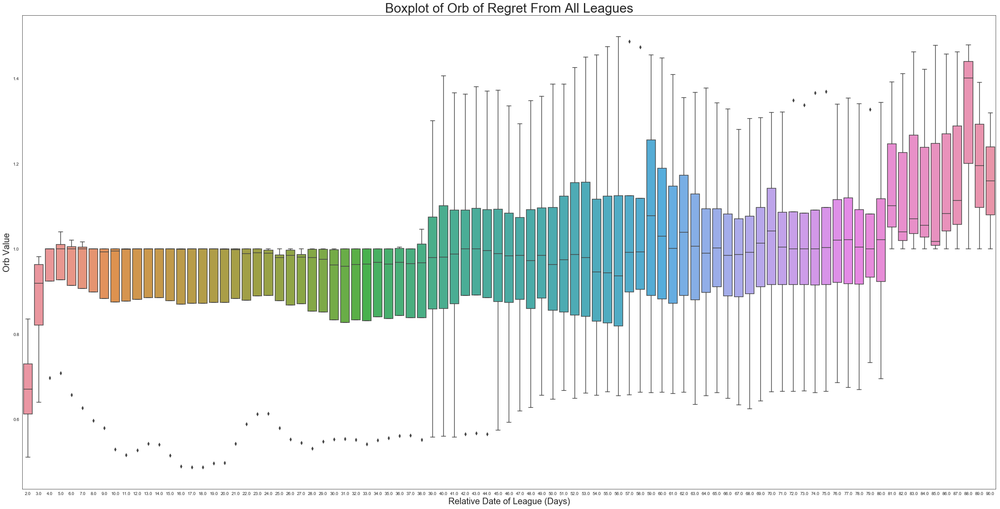

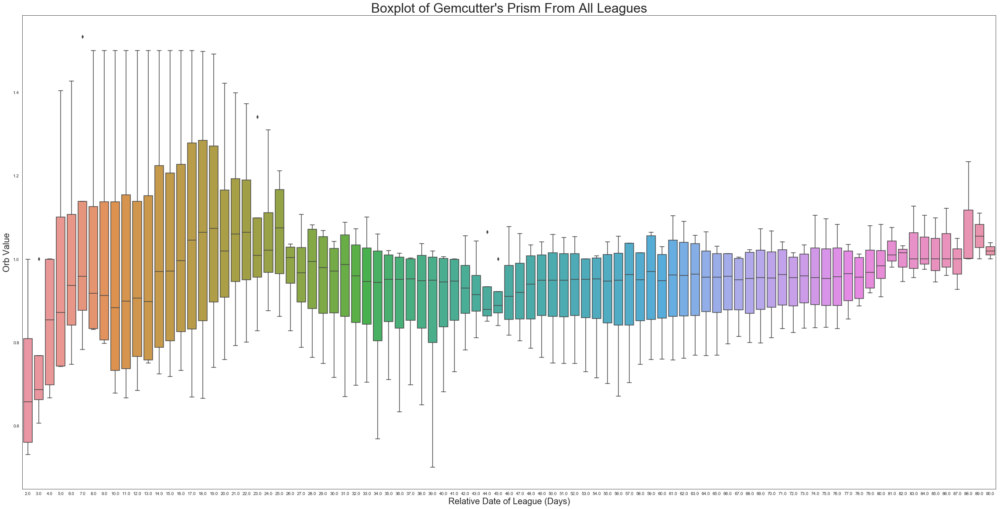

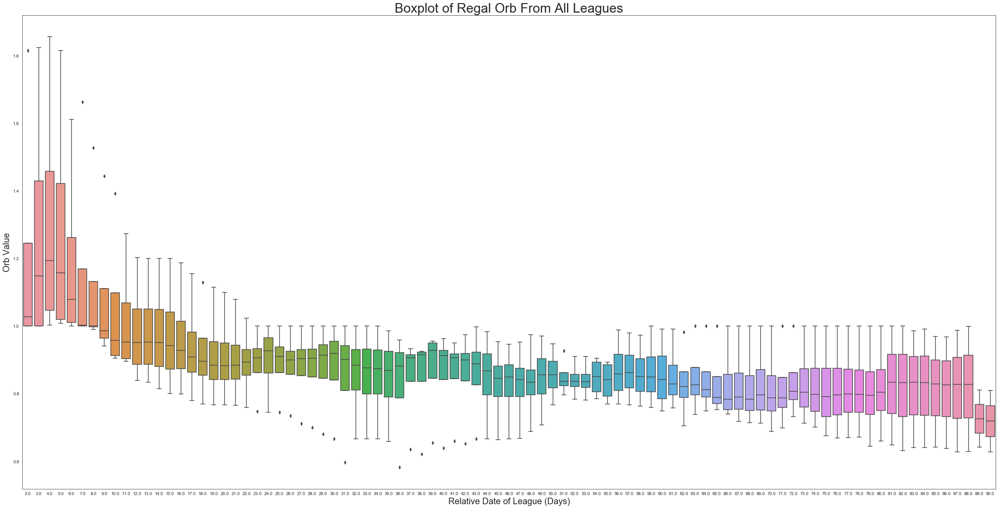

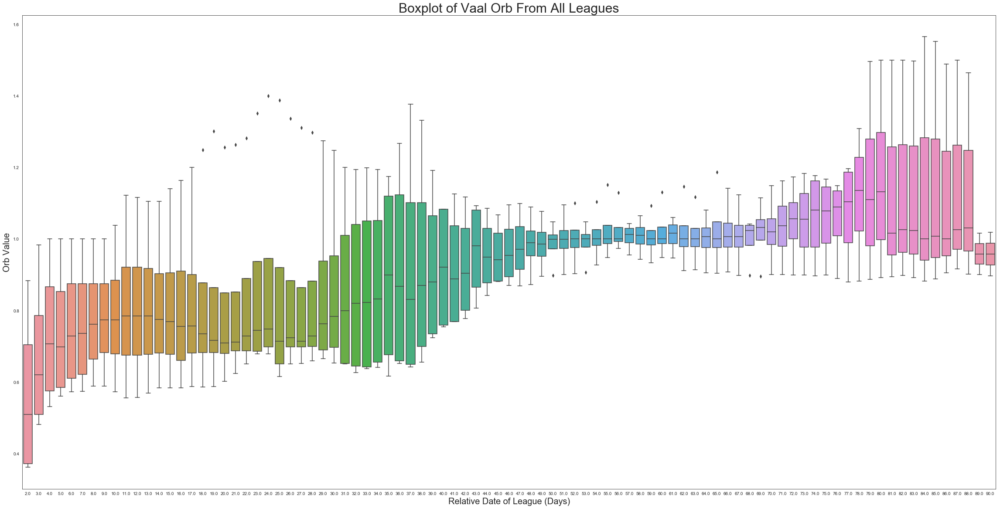

In [156]:
for orb in major_orbs:
    chaos_orb_df = currency_df_pared[(currency_df_pared["Get"] == orb) & (currency_df_pared["Pay"] == "Chaos Orb")]
    plt.figure(figsize = (40, 20))
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = chaos_orb_df)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
    ax.set_ylabel("Orb Value", fontsize = 20)
    ax.set_title("Boxplot of " + orb +" From All Leagues", fontsize = 30)

#### Boxplots for Minor Orbs:

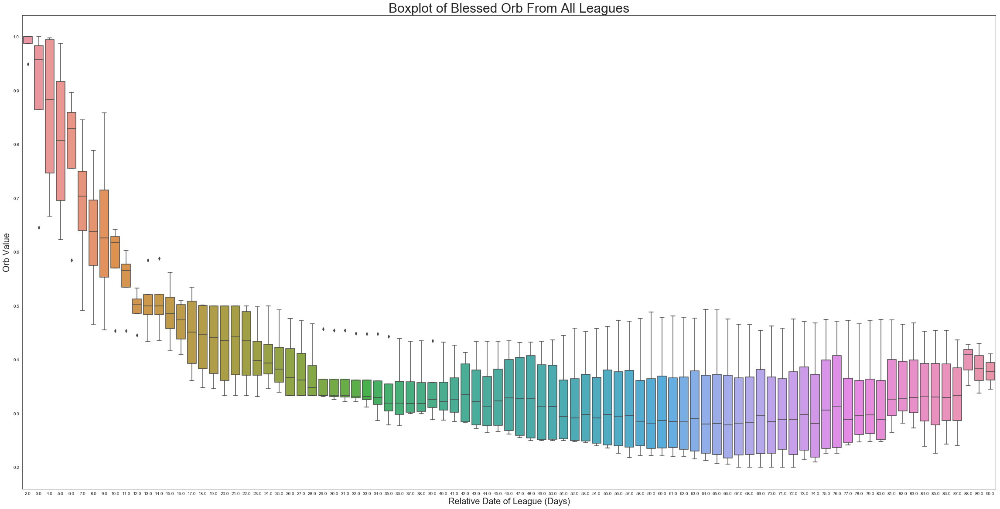

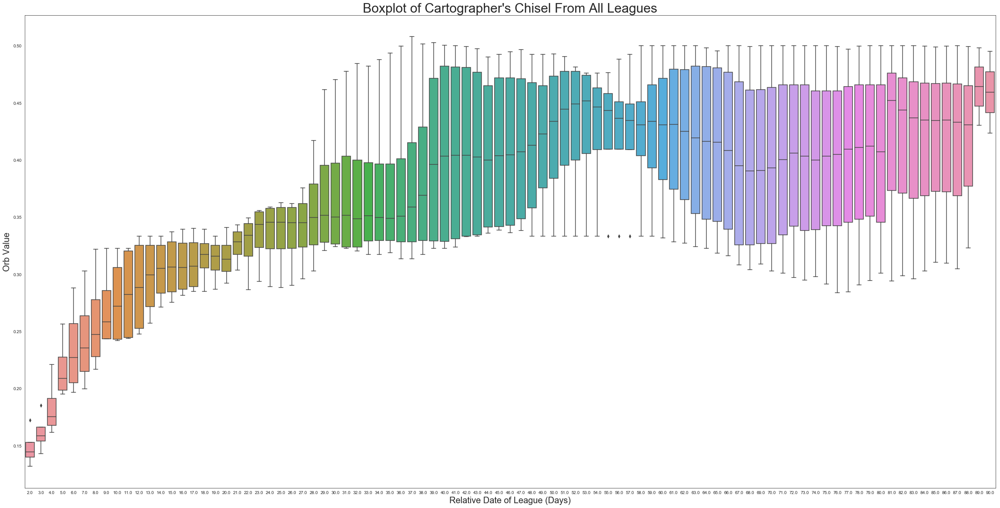

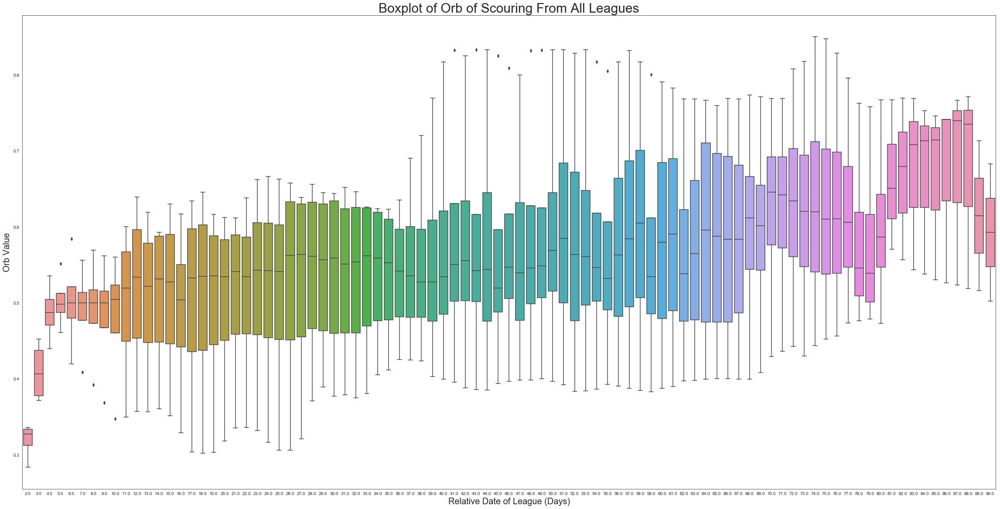

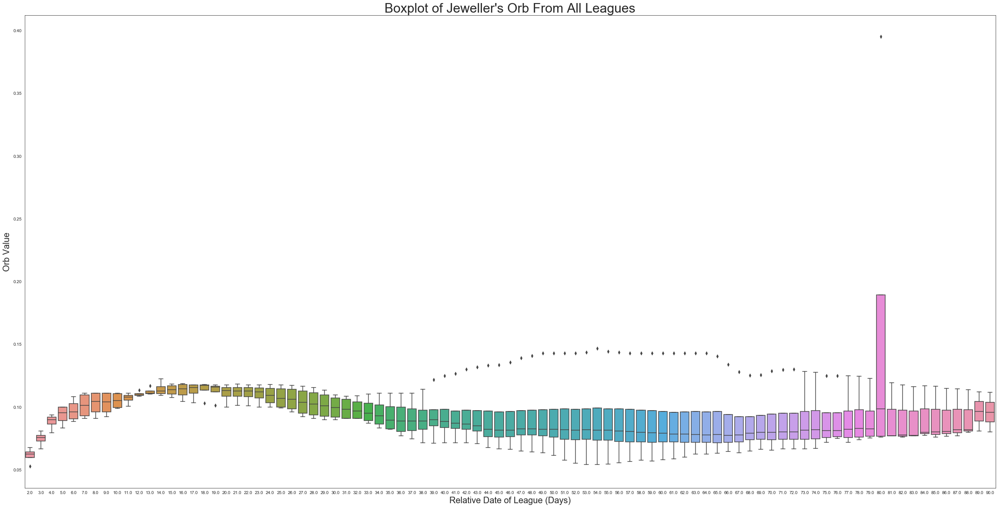

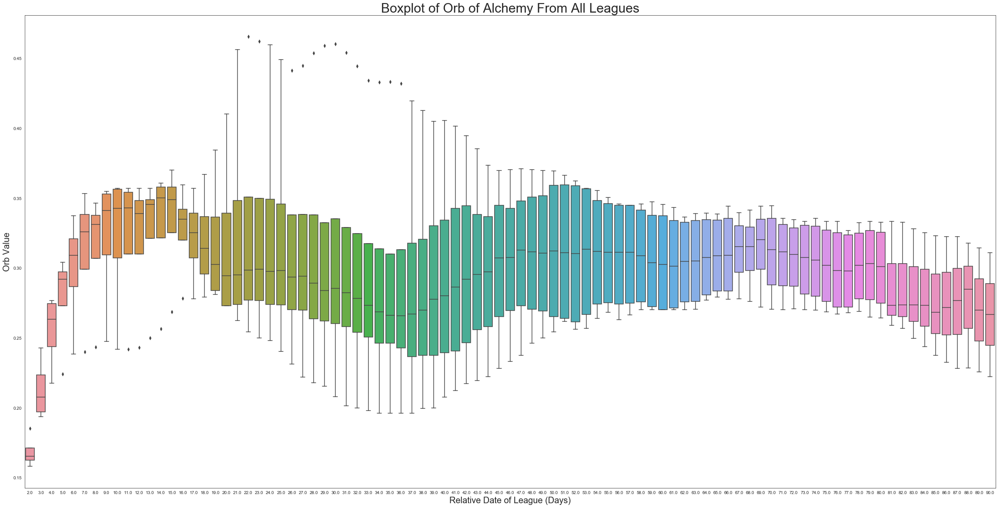

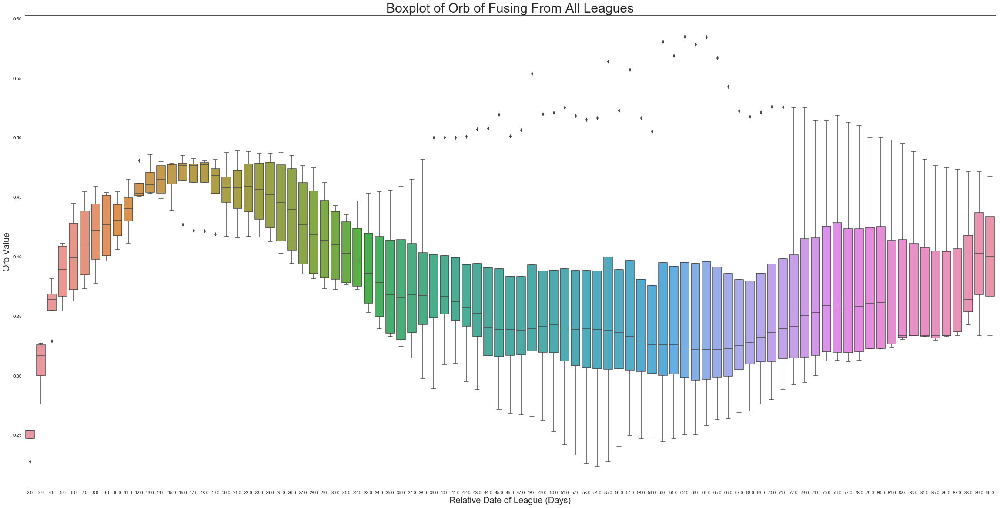

In [157]:
for orb in minor_orbs:
    chaos_orb_df = currency_df_pared[(currency_df_pared["Get"] == orb) & (currency_df_pared["Pay"] == "Chaos Orb")]
    plt.figure(figsize = (40, 20))
    ax = sns.boxplot(x = "RelativeDateInt", y = "Value", data = chaos_orb_df)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
    ax.set_ylabel("Orb Value", fontsize = 20)
    ax.set_title("Boxplot of " + orb +" From All Leagues", fontsize = 30)

### Examining exalt to chaos ratios
Now let's take a look at the ratios of the values for exalts and chaos orbs, the two most commonly traded currency orbs that are used in the majority of item trades.

In [158]:
chaos_exalt_df = currency_df_pared[(currency_df_pared["Get"] == "Exalted Orb") & (currency_df_pared["Pay"] == "Chaos Orb")]

Text(0.5,1,'Value of Exalts in Chaos')

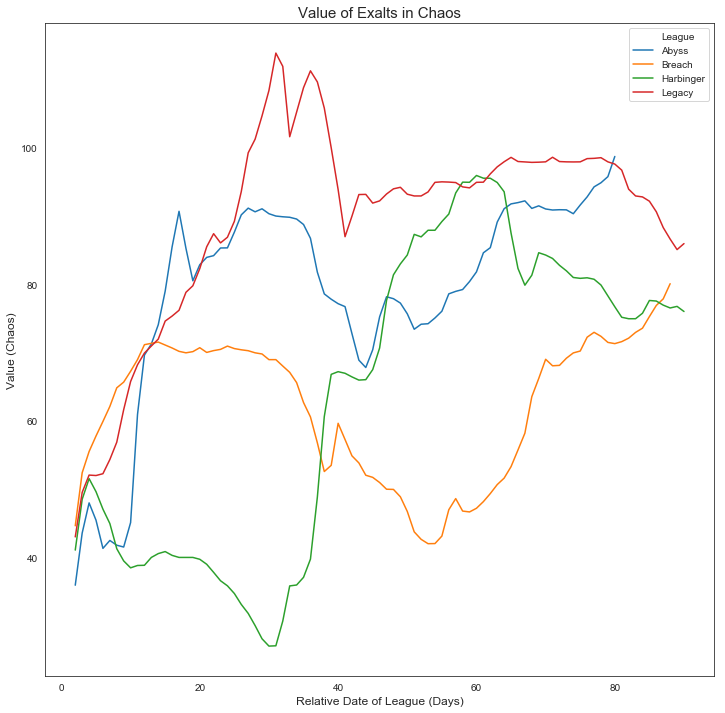

In [159]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", data = chaos_exalt_df, hue_order = league_name_list)
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Chaos)", fontsize = 12)
ax.set_title("Value of Exalts in Chaos", fontsize = 15)

Text(0.5,1,'Value of Chaos in Exalts')

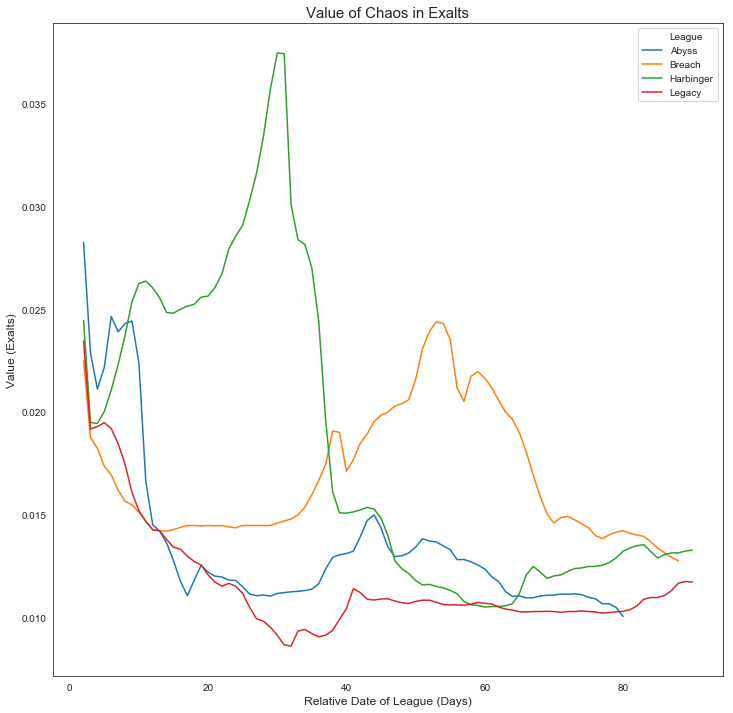

In [160]:
exalt_chaos_df = currency_df_pared[(currency_df_pared["Get"] == "Chaos Orb") & (currency_df_pared["Pay"] == "Exalted Orb")]
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", hue = "League", data = exalt_chaos_df, hue_order = league_name_list)
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Exalts)", fontsize = 12)
ax.set_title("Value of Chaos in Exalts", fontsize = 15)

Now let's just investigate what happens for one league (in this case, the Abyss league as an example). Splitting the data up into chaos -> exalt and exalt -> chaos conversions, we can plot both on the same graph.

In [161]:
c_e_abyss_df = chaos_exalt_df[chaos_exalt_df["League"] == "Abyss"].reset_index(drop = True)
e_c_abyss_df = exalt_chaos_df[exalt_chaos_df["League"] == "Abyss"].reset_index(drop = True)

Text(0,0.5,'Value (Exalts)')

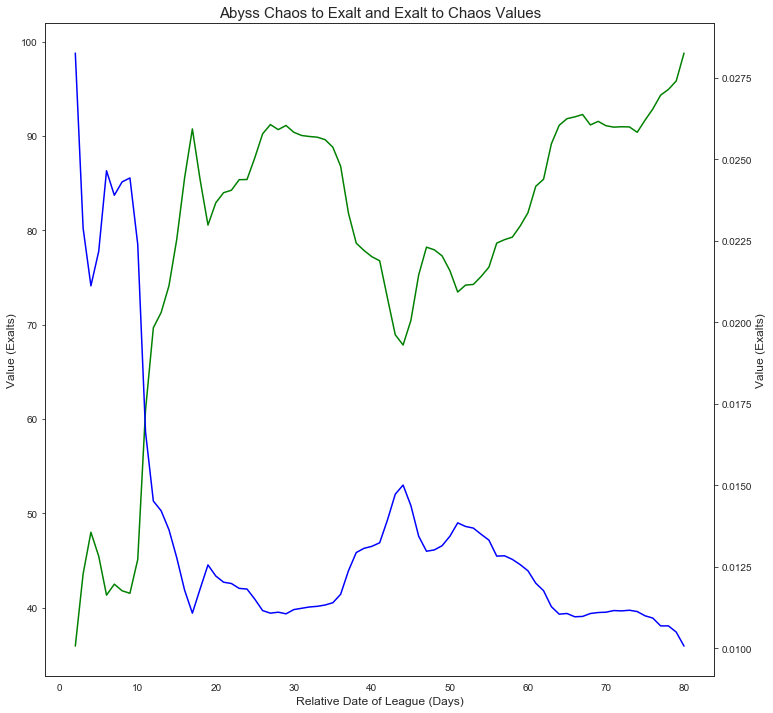

In [162]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = c_e_abyss_df, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value (Exalts)", fontsize = 12)
ax.set_title("Abyss Chaos to Exalt and Exalt to Chaos Values", fontsize = 15)
ax2 = ax.twinx()
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_abyss_df, color = "b")
ax2.set_ylabel("Value (Exalts)", fontsize = 12)

Now let's take a look at the *ratio* of these two values. Essentially, what we're looking at is the value you'll receive by taking an exalt, converting it into chaos orbs then reconverting back into an exalt.

In [163]:
e_c_conversion = pd.DataFrame()
e_c_conversion["Value"] = e_c_abyss_df.Value.multiply(c_e_abyss_df.Value)
e_c_conversion["RelativeDateInt"] = e_c_abyss_df["RelativeDateInt"]
e_c_conversion.head()

,Value,RelativeDateInt
0,1.015256,2.0
1,0.997407,3.0
2,1.013696,4.0
3,1.008268,5.0
4,1.018739,6.0


Text(0.5,1,'Abyss Ratio of exalt value to chaos value')

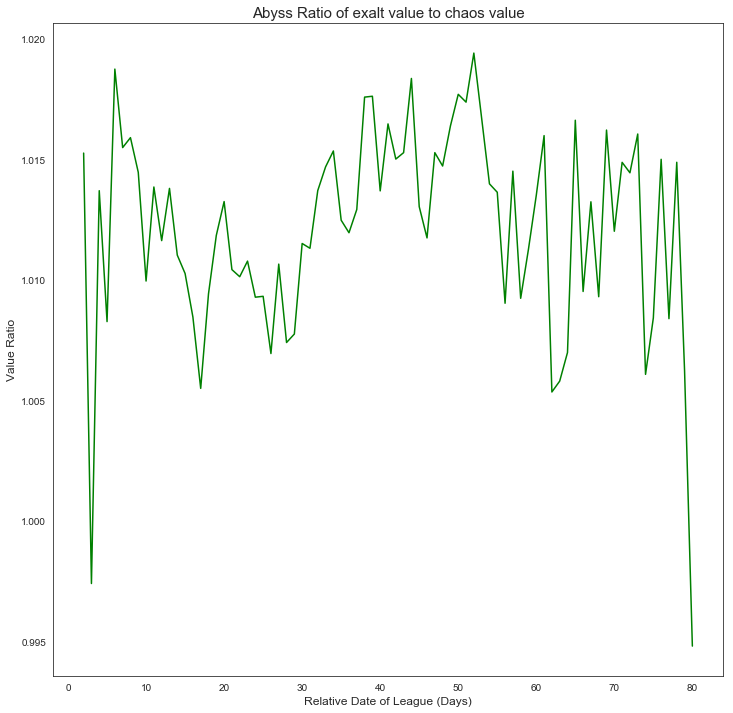

In [164]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_conversion, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Value Ratio", fontsize = 12)
ax.set_title("Abyss Ratio of exalt value to chaos value", fontsize = 15)

To make this a bit less noisy, let's take a rolling mean over a period of 4 days and regraph as above.

In [165]:
e_c_conversion["Rolling Mean Value"] = e_c_conversion.Value.rolling(4, min_periods=1).mean()

Text(0.5,1,'Abyss Rolling Mean Value Ratio of Exalt Value to Chaos Value')

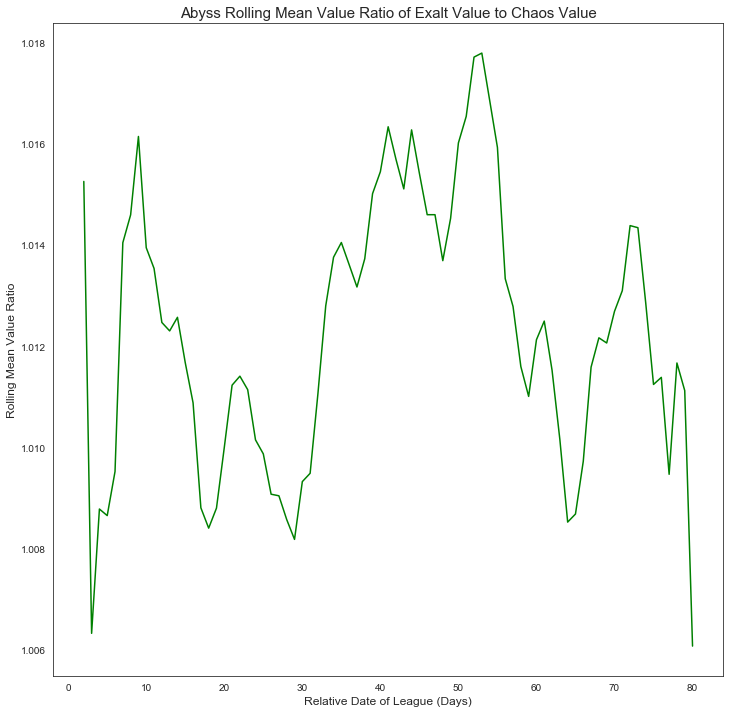

In [166]:
plt.figure(figsize = (12, 12))
ax = sns.lineplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_conversion, color = "g")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
ax.set_ylabel("Rolling Mean Value Ratio", fontsize = 12)
ax.set_title("Abyss Rolling Mean Value Ratio of Exalt Value to Chaos Value", fontsize = 15)

#### Let's generalize this for all leagues in our dataframe

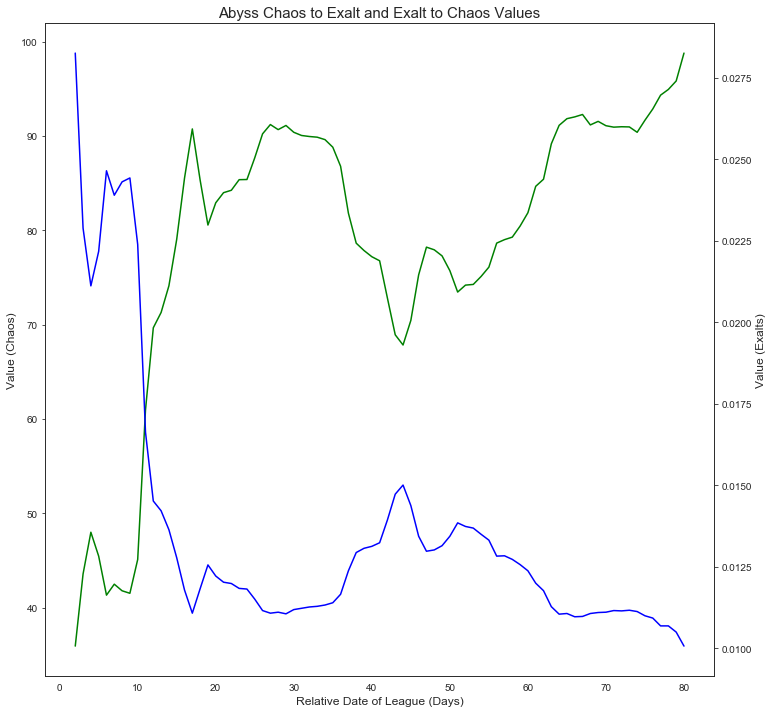

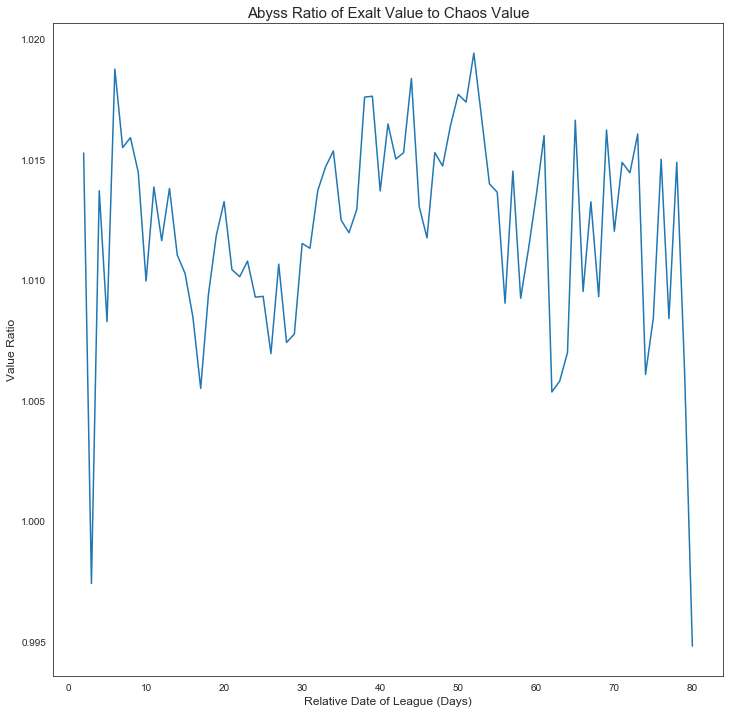

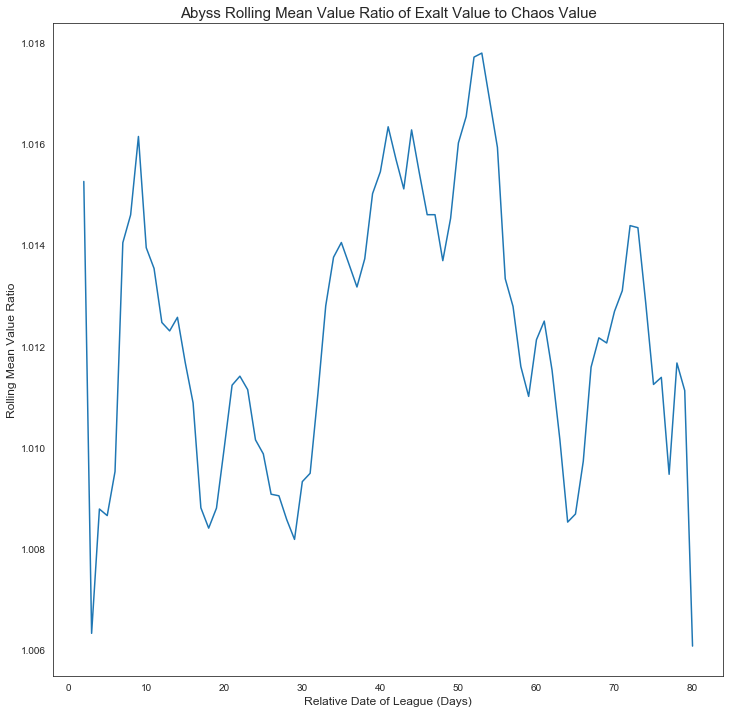

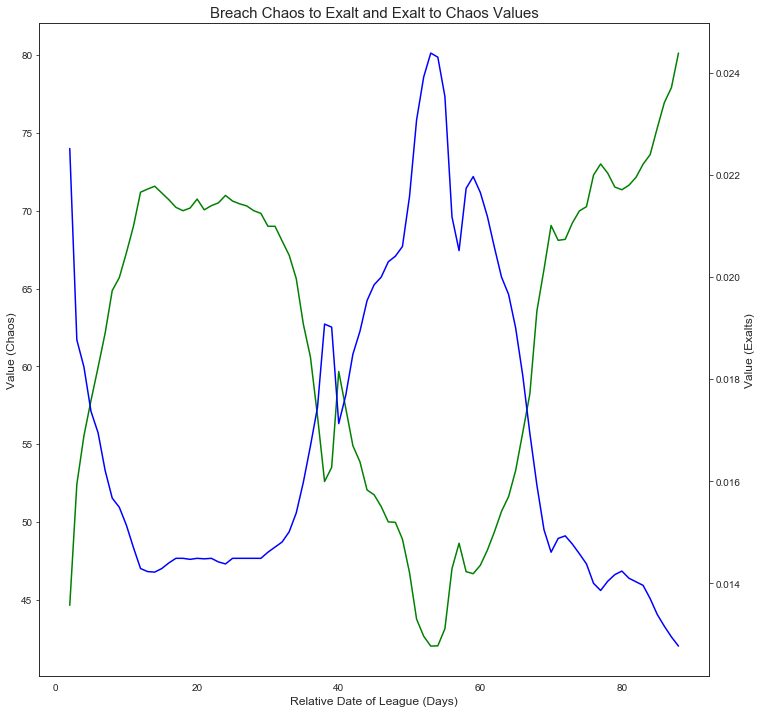

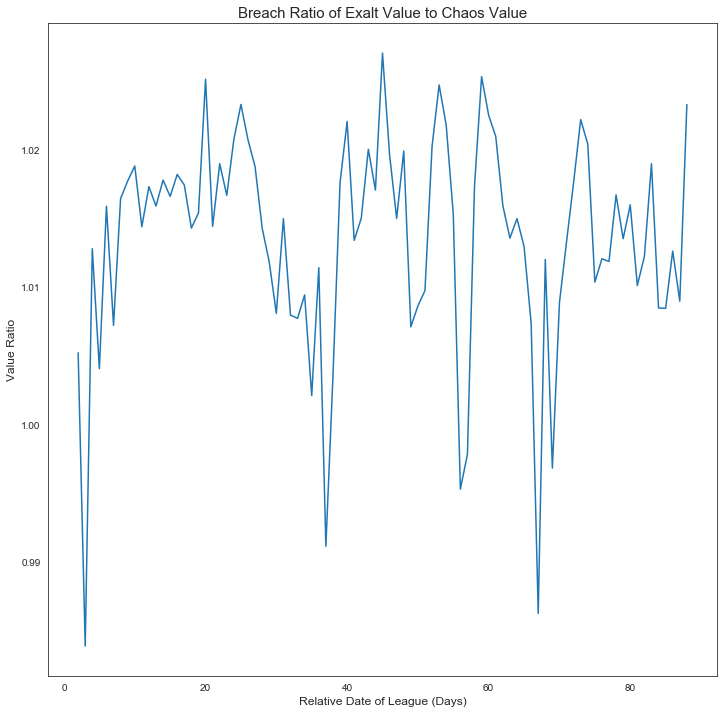

...

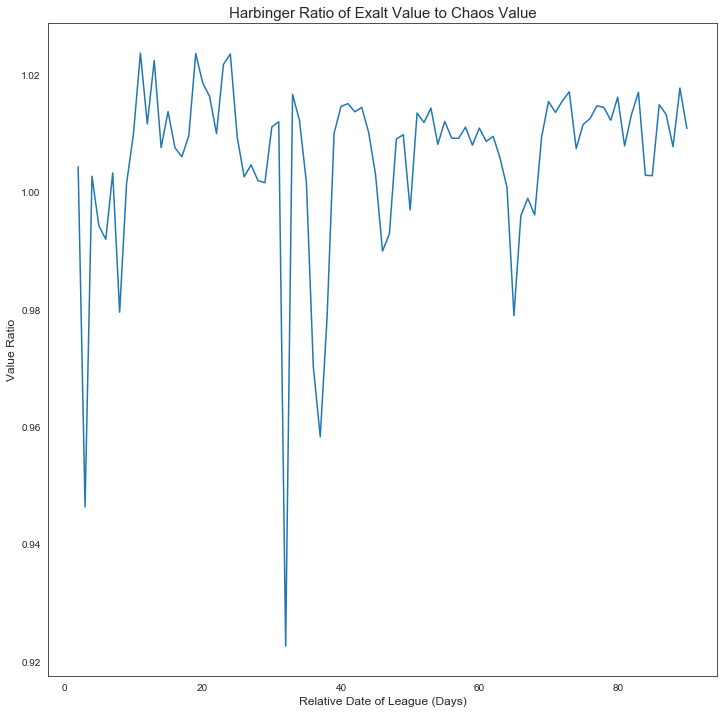

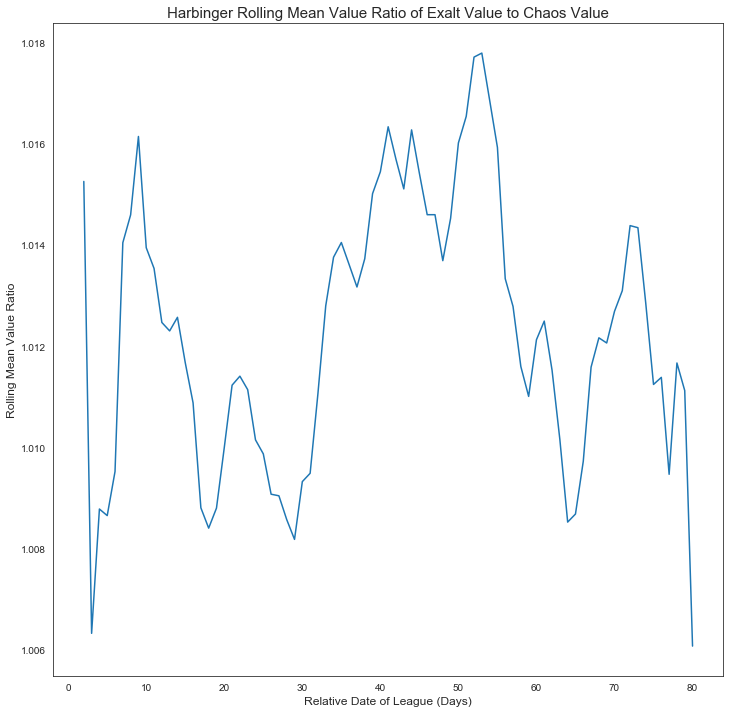

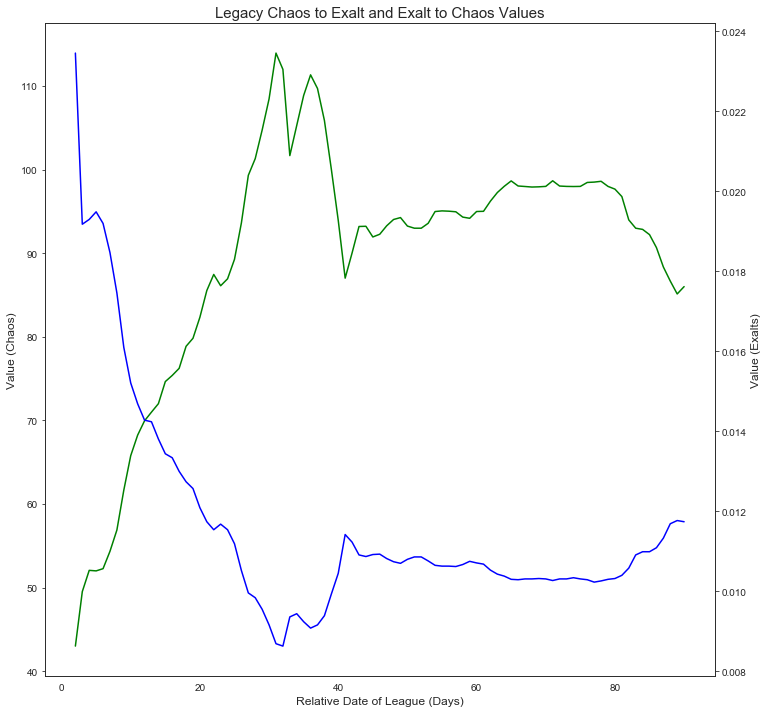

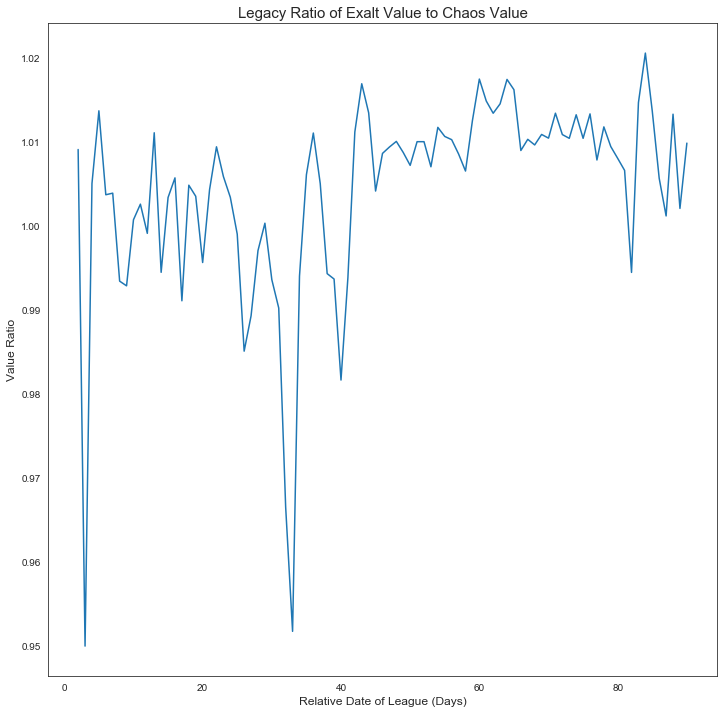

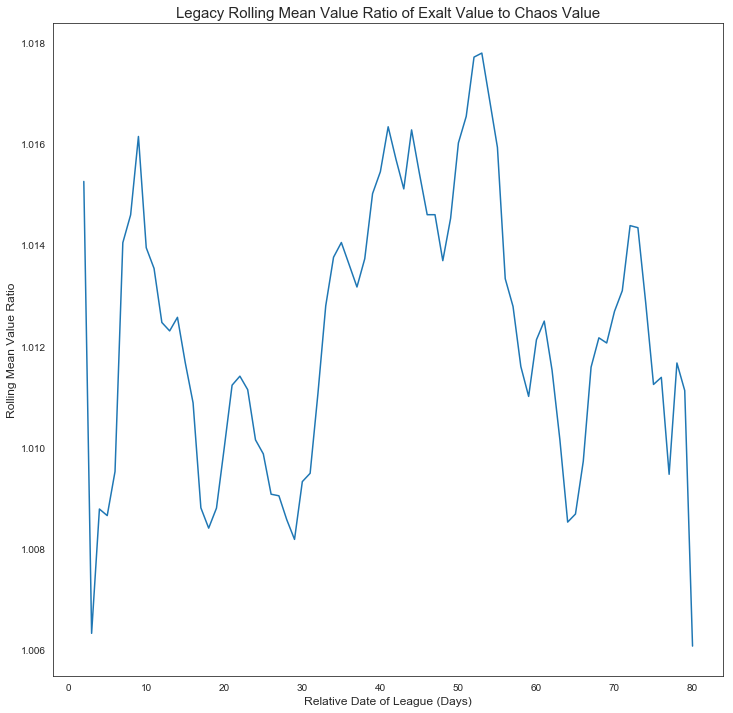

In [167]:
e_c_rolling_means = []
for league in league_name_list:
    c_e_league_df = chaos_exalt_df[chaos_exalt_df["League"] == league].reset_index(drop = True)
    e_c_league_df = exalt_chaos_df[exalt_chaos_df["League"] == league].reset_index(drop = True)
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = c_e_league_df, color = "g")
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Value (Chaos)", fontsize = 12)
    ax.set_title(league + " Chaos to Exalt and Exalt to Chaos Values", fontsize = 15)
    ax2 = ax.twinx()
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_league_df, color = "b")
    ax2.set_ylabel("Value (Exalts)", fontsize = 12)
    fig.tight_layout()
    
    e_c_league_conversion = pd.DataFrame()
    e_c_league_conversion["Value"] = e_c_league_df.Value.multiply(c_e_league_df.Value)
    e_c_league_conversion["RelativeDateInt"] = e_c_league_df["RelativeDateInt"]
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Value", data = e_c_league_conversion)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Value Ratio", fontsize = 12)
    ax.set_title(league + " Ratio of Exalt Value to Chaos Value", fontsize = 15)
    
    e_c_league_conversion["Rolling Mean Value"] = e_c_league_conversion.Value.rolling(4, min_periods = 1).mean()
    e_c_rolling_means.append(e_c_league_conversion)
    plt.figure(figsize = (12, 12))
    ax = sns.lineplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_conversion)
    ax.set_xlabel("Relative Date of League (Days)", fontsize = 12)
    ax.set_ylabel("Rolling Mean Value Ratio", fontsize = 12)
    ax.set_title(league + " Rolling Mean Value Ratio of Exalt Value to Chaos Value", fontsize = 15)

Finally, let's take a look at this rolling mean plot over all the leagues data on one graph

In [168]:
e_c_rolling_means_concat = pd.concat(e_c_rolling_means, axis = 0)

Text(0.5,1,'Boxplot of Rolling Mean Value Exalt/Chaos Ratio From All Leagues')

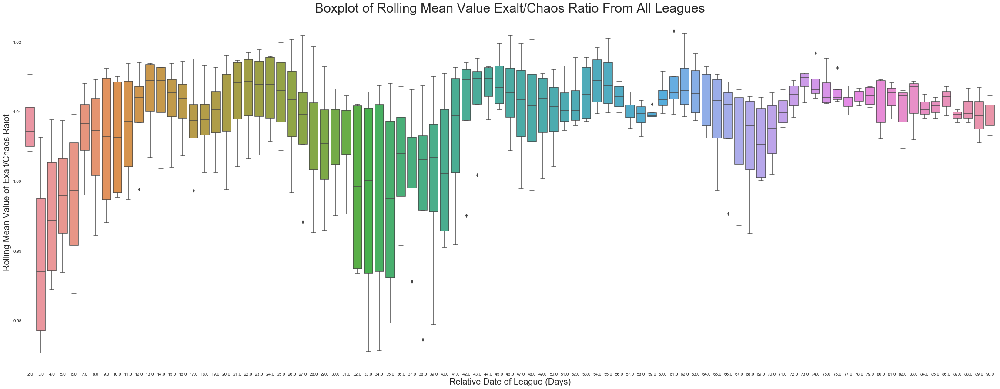

In [169]:
plt.figure(figsize = (40,15))
ax = sns.boxplot(x = "RelativeDateInt", y = "Rolling Mean Value", data = e_c_rolling_means_concat)
ax.set(xlabel = "Relative Date of League (Days)", ylabel = "Rolling Mean Value of Exalt/Chaos Ratio", title = "Boxplot of Rolling Mean Value Exalt/Chaos Ratio from All Leagues")
ax.set_xlabel("Relative Date of League (Days)", fontsize = 20)
ax.set_ylabel("Rolling Mean Value of Exalt/Chaos Raiot", fontsize = 20)
ax.set_title("Boxplot of Rolling Mean Value Exalt/Chaos Ratio From All Leagues", fontsize = 30)

# Inferential Statistics

### Finding Correlation Betwen Items

In [170]:
currency_chaos_norm = currency_df_pared[currency_df_pared.Pay == "Chaos Orb"].reset_index(drop = True)
currency_chaos_norm_mapped = currency_chaos_norm.rename(columns = {"Get" : "Name"})
currency_chaos_edited = currency_chaos_norm_mapped[["League", "Name", "Value", "RelativeDateInt"]]

In [171]:
currency_chaos_edited.reset_index(drop = True)
currency_chaos_edited.head()

,League,Name,Value,RelativeDateInt
0,Breach,Orb of Alchemy,0.16667,2.0
1,Breach,Orb of Alchemy,0.19363,3.0
2,Breach,Orb of Alchemy,0.21778,4.0
3,Breach,Orb of Alchemy,0.22417,5.0
4,Breach,Orb of Alchemy,0.23853,6.0


In [172]:
item_name_df = item_df_pared[["League", "Name", "Value", "RelativeDateInt"]].reset_index(drop = True)
item_name_df.head()

,League,Name,Value,RelativeDateInt
0,Breach,The Fiend,220.91509,2.0
1,Breach,The Fiend,204.06750,3.0
2,Breach,The Fiend,197.80446,4.0
3,Breach,The Fiend,224.65947,5.0
4,Breach,The Fiend,278.00750,6.0


In [173]:
currency_item_df = pd.concat([currency_chaos_edited, item_name_df], axis = 0)
currency_item_df.shape

(21309, 4)

### Filter out only specific items that may have a strong correlation between them:

In [174]:
correlated_items_list = ["The Fiend", "The Doctor", "Headhunter", "United in Dream", "The Blue Nightmare", "The Green Nightmare", "The Red Nightmare", "Emperor's Mastery", "Skyforth", "Atziri's Acuity", "Atziri's Disfavour", "The Retch", "House of Mirrors", "Trash to Treasure", "Fated Connections", "Mortal Ignorance", "Mortal Hope", "Blessing of Chayula", "Chayula's Breachstone", "Splinter of Chayula", "Exalted Orb", "Orb of Fusing"]

In [175]:
currency_item_df_pared = currency_item_df.loc[currency_item_df["Name"].isin(correlated_items_list)]
currency_item_df_pared.reset_index(drop = True, inplace = True)
currency_item_df_pared.shape

(7943, 4)

In [176]:
currency_item_df_pared.head()

,League,Name,Value,RelativeDateInt
0,Breach,Orb of Fusing,0.25408,2.0
1,Breach,Orb of Fusing,0.32707,3.0
2,Breach,Orb of Fusing,0.36445,4.0
3,Breach,Orb of Fusing,0.40789,5.0
4,Breach,Orb of Fusing,0.42236,6.0


In [177]:
pared_grouped = currency_item_df_pared.groupby(["Name", "RelativeDateInt"])["Value"].agg("median")
df = pared_grouped.to_frame().reset_index()

In [178]:
df_pivot = df.pivot(index = "RelativeDateInt", columns = "Name", values = "Value")

In [179]:
df_pivot

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,325.000000,84.567040,257.096840,42.044080,489.499510,3798.192720,524.491610,16.712365,...,1337.233340,0.964305,NaN,338.236165,225.775350,NaN,NaN,246.795000,1695.108210,NaN
3.0,616.026995,498.692780,333.590735,100.000000,284.817100,49.031000,557.718290,3576.044040,356.176860,17.839185,...,933.105110,0.997840,NaN,280.868325,224.591730,NaN,NaN,219.158790,1187.215880,592.617300
4.0,553.601515,524.279120,353.909915,119.527440,293.743490,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.000000,NaN,303.296480,232.650030,NaN,NaN,174.549660,492.494690,507.524710
5.0,565.882070,585.467560,290.926000,130.010000,289.947230,50.823135,508.379930,3817.995380,607.782190,28.207115,...,811.156935,1.000000,NaN,315.761790,235.089335,NaN,NaN,171.099140,958.342190,471.171520
6.0,570.088675,626.317145,301.076000,124.395000,371.385120,49.676015,584.541090,3971.124605,564.591205,28.341655,...,842.025210,1.000000,NaN,338.933515,249.164925,NaN,630.600000,164.840180,439.379600,400.000000
7.0,611.931910,611.684700,265.107840,127.789565,388.952455,49.659740,595.650560,3960.427860,512.582715,29.688115,...,929.970580,1.000000,380.798540,377.514580,256.018620,NaN,437.122160,161.840860,559.981250,428.963335
8.0,650.073820,624.858755,282.340925,155.747705,375.923710,49.342510,574.235925,3616.346210,418.295470,31.048770,...,1054.948905,1.095430,399.075520,387.245965,259.273100,NaN,375.421820,187.350350,1299.046335,440.894660
9.0,727.399965,674.417480,302.966105,158.884545,404.361490,51.596170,618.867980,3497.003520,383.856105,31.850660,...,1133.966070,1.288945,370.810880,404.386720,292.100700,NaN,503.020000,197.142460,1292.834470,443.362810
10.0,775.775535,669.412355,348.045000,174.817090,495.237080,55.449655,675.754855,3454.266835,423.365305,32.243475,...,1178.430415,1.487165,390.162410,421.093610,319.656195,554.610950,628.864330,101.029390,1190.719820,460.051490


In [180]:
df_pivot.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 89 entries, 2.0 to 90.0
Data columns (total 22 columns):
Atziri's Acuity          89 non-null float64
Atziri's Disfavour       89 non-null float64
Blessing of Chayula      89 non-null float64
Chayula's Breachstone    89 non-null float64
Emperor's Mastery        89 non-null float64
Exalted Orb              89 non-null float64
Fated Connections        89 non-null float64
Headhunter               89 non-null float64
House of Mirrors         89 non-null float64
Mortal Hope              89 non-null float64
Mortal Ignorance         89 non-null float64
Orb of Fusing            89 non-null float64
Skyforth                 89 non-null float64
Splinter of Chayula      89 non-null float64
The Blue Nightmare       84 non-null float64
The Doctor               89 non-null float64
The Fiend                89 non-null float64
The Green Nightmare      81 non-null float64
The Red Nightmare        85 non-null float64
The Retch                89 non-null

In [181]:
df_pivot[pd.isnull(df_pivot).any(axis = 1)].head(15)

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,325.000000,84.567040,257.096840,42.044080,489.499510,3798.192720,524.491610,16.712365,...,1337.233340,0.964305,NaN,338.236165,225.775350,NaN,NaN,246.79500,1695.108210,NaN
3.0,616.026995,498.692780,333.590735,100.000000,284.817100,49.031000,557.718290,3576.044040,356.176860,17.839185,...,933.105110,0.997840,NaN,280.868325,224.591730,NaN,NaN,219.15879,1187.215880,592.617300
4.0,553.601515,524.279120,353.909915,119.527440,293.743490,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.000000,NaN,303.296480,232.650030,NaN,NaN,174.54966,492.494690,507.524710
5.0,565.882070,585.467560,290.926000,130.010000,289.947230,50.823135,508.379930,3817.995380,607.782190,28.207115,...,811.156935,1.000000,NaN,315.761790,235.089335,NaN,NaN,171.09914,958.342190,471.171520
6.0,570.088675,626.317145,301.076000,124.395000,371.385120,49.676015,584.541090,3971.124605,564.591205,28.341655,...,842.025210,1.000000,NaN,338.933515,249.164925,NaN,630.60000,164.84018,439.379600,400.000000
7.0,611.931910,611.684700,265.107840,127.789565,388.952455,49.659740,595.650560,3960.427860,512.582715,29.688115,...,929.970580,1.000000,380.79854,377.514580,256.018620,NaN,437.12216,161.84086,559.981250,428.963335
8.0,650.073820,624.858755,282.340925,155.747705,375.923710,49.342510,574.235925,3616.346210,418.295470,31.048770,...,1054.948905,1.095430,399.07552,387.245965,259.273100,NaN,375.42182,187.35035,1299.046335,440.894660
9.0,727.399965,674.417480,302.966105,158.884545,404.361490,51.596170,618.867980,3497.003520,383.856105,31.850660,...,1133.966070,1.288945,370.81088,404.386720,292.100700,NaN,503.02000,197.14246,1292.834470,443.362810
90.0,2769.712075,308.090175,204.200185,127.073035,1114.216850,81.035975,902.414540,5791.092555,1367.338185,81.150930,...,1905.056060,1.228395,340.90461,716.442020,509.974865,419.570425,549.91433,564.28638,NaN,240.831865


In [182]:
df_pivot_full = df_pivot.bfill(axis = 0).ffill(axis = 0)

In [183]:
df_pivot_full.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 89 entries, 2.0 to 90.0
Data columns (total 22 columns):
Atziri's Acuity          89 non-null float64
Atziri's Disfavour       89 non-null float64
Blessing of Chayula      89 non-null float64
Chayula's Breachstone    89 non-null float64
Emperor's Mastery        89 non-null float64
Exalted Orb              89 non-null float64
Fated Connections        89 non-null float64
Headhunter               89 non-null float64
House of Mirrors         89 non-null float64
Mortal Hope              89 non-null float64
Mortal Ignorance         89 non-null float64
Orb of Fusing            89 non-null float64
Skyforth                 89 non-null float64
Splinter of Chayula      89 non-null float64
The Blue Nightmare       89 non-null float64
The Doctor               89 non-null float64
The Fiend                89 non-null float64
The Green Nightmare      89 non-null float64
The Red Nightmare        89 non-null float64
The Retch                89 non-null

In [201]:
df_pivot_full.head()

Name,Atziri's Acuity,Atziri's Disfavour,Blessing of Chayula,Chayula's Breachstone,Emperor's Mastery,Exalted Orb,Fated Connections,Headhunter,House of Mirrors,Mortal Hope,...,Skyforth,Splinter of Chayula,The Blue Nightmare,The Doctor,The Fiend,The Green Nightmare,The Red Nightmare,The Retch,Trash to Treasure,United in Dream
RelativeDateInt,,,,,,,,,,,,,,,,,,,,,
2.0,701.576430,461.178735,325.000000,84.56704,257.09684,42.044080,489.499510,3798.192720,524.491610,16.712365,...,1337.233340,0.964305,380.79854,338.236165,225.775350,554.61095,630.6,246.79500,1695.10821,592.61730
3.0,616.026995,498.692780,333.590735,100.00000,284.81710,49.031000,557.718290,3576.044040,356.176860,17.839185,...,933.105110,0.997840,380.79854,280.868325,224.591730,554.61095,630.6,219.15879,1187.21588,592.61730
4.0,553.601515,524.279120,353.909915,119.52744,293.74349,51.812155,499.511835,3218.551090,487.253570,22.156840,...,827.176530,1.000000,380.79854,303.296480,232.650030,554.61095,630.6,174.54966,492.49469,507.52471
5.0,565.882070,585.467560,290.926000,130.01000,289.94723,50.823135,508.379930,3817.995380,607.782190,28.207115,...,811.156935,1.000000,380.79854,315.761790,235.089335,554.61095,630.6,171.09914,958.34219,471.17152
6.0,570.088675,626.317145,301.076000,124.39500,371.38512,49.676015,584.541090,3971.124605,564.591205,28.341655,...,842.025210,1.000000,380.79854,338.933515,249.164925,554.61095,630.6,164.84018,439.37960,400.00000


In [193]:
# Define a heatmap function
def halfHeatMap(df, mirror, corrtype):

    # Create Correlation df
    corr = df.corr(method = corrtype)
    # Plot figsize
    fig, ax = plt.subplots(figsize=(15, 15))
    # Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)

    if mirror == True:
        #Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")
        #show plot

    else:
        # Drop self-correlations
        dropSelf = np.zeros_like(corr)
        dropSelf[np.triu_indices_from(dropSelf)] = True# Generate Color Map
        colormap = sns.diverging_palette(220, 10, as_cmap=True)
        # Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f", mask=dropSelf)
        #show plot
        plt.show()
    plt.show()

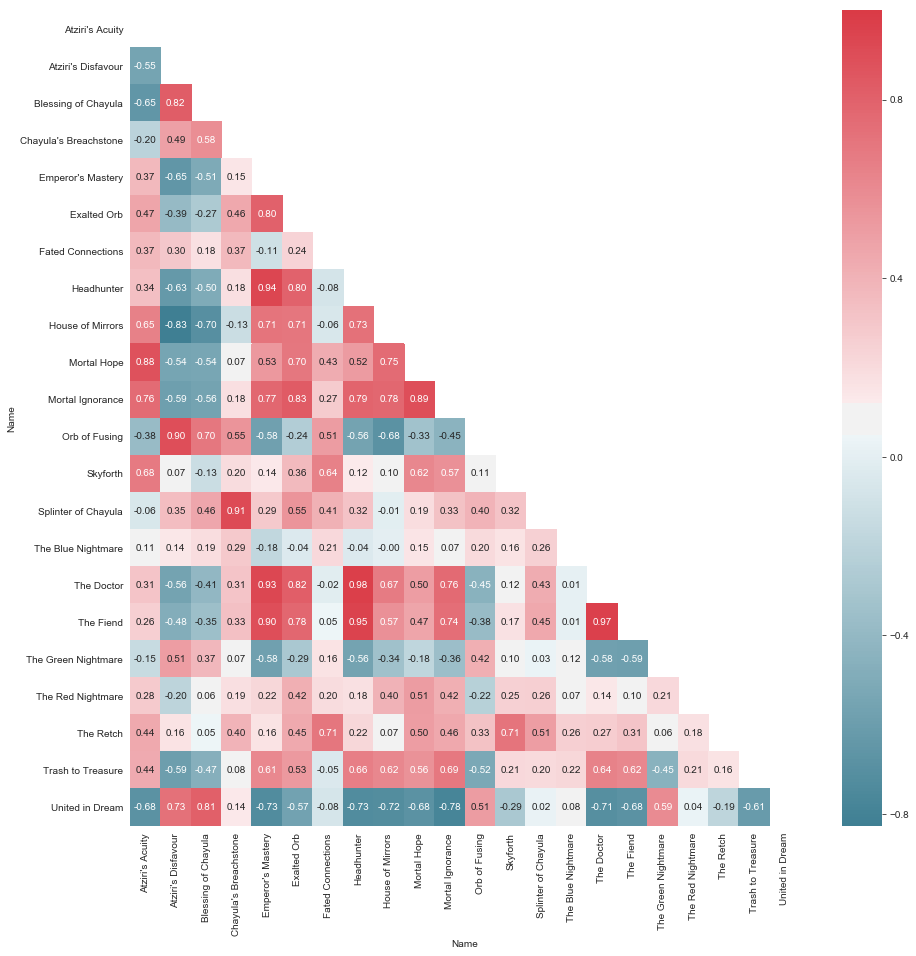

In [196]:
# Pearson Correlation heatmap
halfHeatMap(df_pivot_full, mirror = False, corrtype = "pearson")

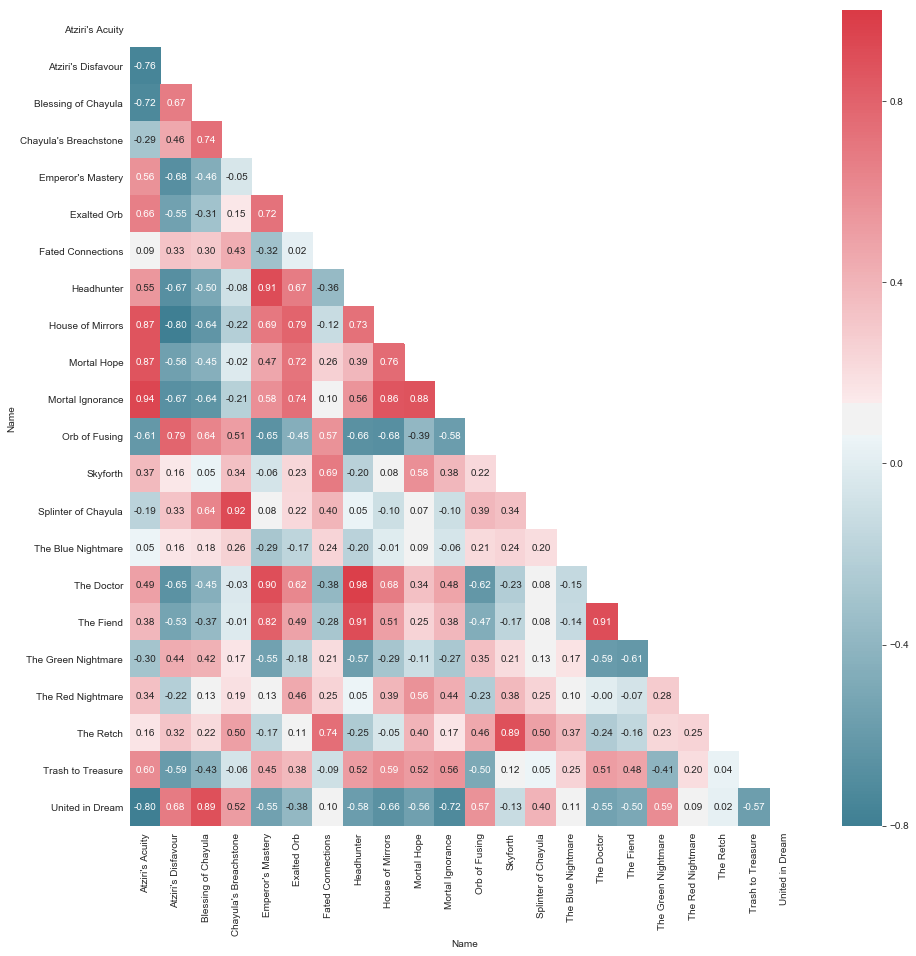

In [197]:
# Spearman Correlation heatmap
halfHeatMap(df_pivot_full, mirror = False, corrtype = "spearman")

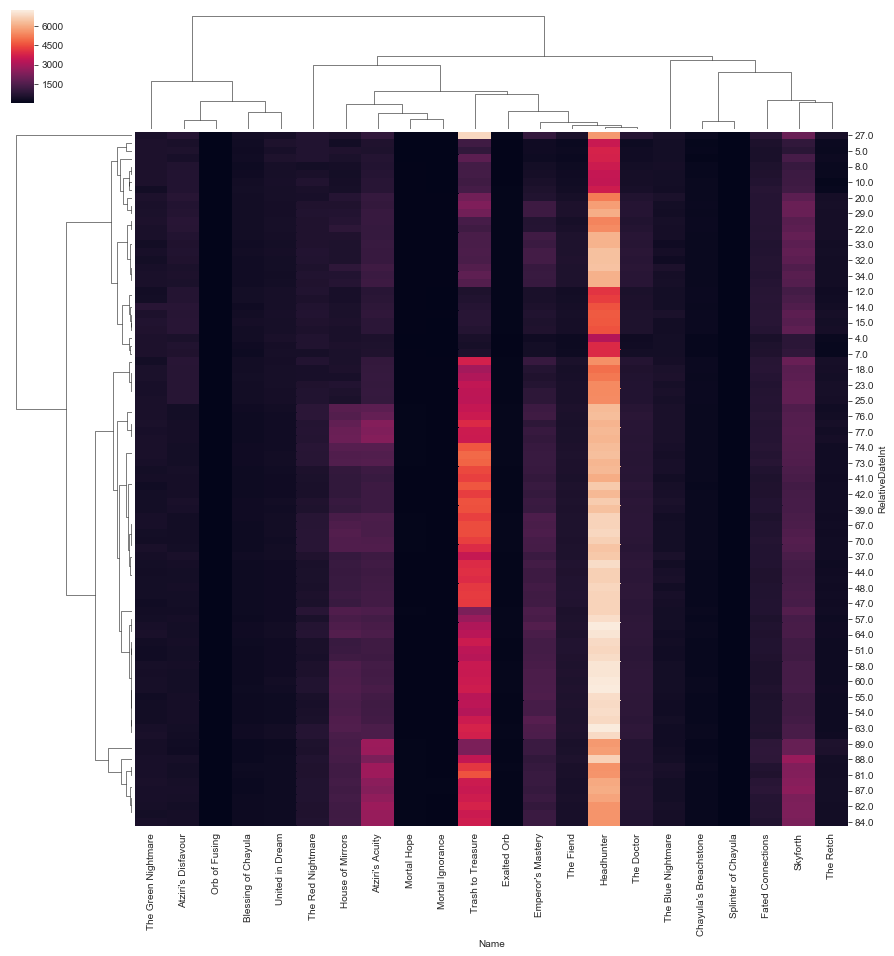

In [200]:
_ = sns.clustermap(df_pivot_full, figsize = (15, 15), metric = "correlation")